Okello Andrew Peters        Nalikka Joan Deborah

**Life Expectancy is becoming a major concern today with a rise of food insecurity and other factors. We're using a dataset called Life Expectancy to help us understand the nexus between life expectancy and a number of control factors.**

In [ ]:
#importing pandas library
import pandas as pd

In [ ]:
df = pd.read_csv('https://raw.githubusercontent.com/OkelloAndrewPeters/datascience/main/LifeExpectancyData.csv')

In [ ]:
df.shape

(2938, 22)

In [ ]:
# Display the first few rows and check basic information of the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2938 non-null   object 
 1   Year                             2938 non-null   int64  
 2   Status                           2938 non-null   object 
 3   Life expectancy                  2928 non-null   float64
 4   Adult Mortality                  2928 non-null   float64
 5   infant deaths                    2938 non-null   int64  
 6   Alcohol                          2744 non-null   float64
 7   percentage expenditure           2938 non-null   float64
 8   Hepatitis B                      2385 non-null   float64
 9   Measles                          2938 non-null   int64  
 10   BMI                             2904 non-null   float64
 11  under-five deaths                2938 non-null   int64  
 12  Polio               

In [ ]:
df.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


**From the analysis above,Several columns have missing values, with some having substantial gaps (e.g., Hepatitis B, Population, and GDP).**

In [ ]:
#columns with minor missing values such as Life expectancy, Adult Mortality, BMI, I'm going to impute mean or median
#let us first check for missing values
missing_values = df.isnull().sum()

#display columns with missing values
missing_values[missing_values > 0]

,0
Life expectancy,10
Adult Mortality,10
Alcohol,194
Hepatitis B,553
BMI,34
Polio,19
Total expenditure,226
Diphtheria,19
GDP,448
Population,652


In [ ]:
#Cleaning column names. Removing white spaces
df.columns = df.columns.str.strip()

In [ ]:

# Impute missing values with median for columns where missing values are relatively few
columns_to_impute = ['Life expectancy', 'Adult Mortality', 'Alcohol', 'BMI', 'Polio',
                     'Total expenditure', 'Diphtheria', 'thinness  1-19 years',
                     'thinness 5-9 years', 'Income composition of resources', 'Schooling']

# Fill missing values with the median
df[columns_to_impute] = df[columns_to_impute].apply(lambda col: col.fillna(col.median()))

# For columns with more significant missing values like 'GDP', 'Population', 'Hepatitis B',
# we'll use median imputation for now as a temporary solution.
columns_with_high_missing = ['GDP', 'Population', 'Hepatitis B']
df[columns_with_high_missing] = df[columns_with_high_missing].apply(lambda col: col.fillna(col.median()))

# Check if all missing values have been filled
missing_after_imputation = df.isnull().sum()

# Check if any missing values remain
missing_after_imputation[missing_after_imputation > 0]


,0


In [ ]:
print(df.isnull().sum())

Country                            0
Year                               0
Status                             0
Life expectancy                    0
Adult Mortality                    0
infant deaths                      0
Alcohol                            0
percentage expenditure             0
Hepatitis B                        0
Measles                            0
BMI                                0
under-five deaths                  0
Polio                              0
Total expenditure                  0
Diphtheria                         0
HIV/AIDS                           0
GDP                                0
Population                         0
thinness  1-19 years               0
thinness 5-9 years                 0
Income composition of resources    0
Schooling                          0
dtype: int64


In [ ]:
#dealing with outliers and categorical values
numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns

# Handling categorical columns using Label Encoding
categorical_cols = df.select_dtypes(include=['object']).columns

from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
df['Status'] = le.fit_transform(df['Status'])
df['Country'] = le.fit_transform(df['Country'])


In [ ]:
df.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,0,2015,1,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,0,2014,1,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,0,2013,1,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,0,2012,1,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,0,2011,1,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [ ]:
#dealing with outliers for numerical columns
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2938 non-null   int64  
 1   Year                             2938 non-null   int64  
 2   Status                           2938 non-null   int64  
 3   Life expectancy                  2938 non-null   float64
 4   Adult Mortality                  2938 non-null   float64
 5   infant deaths                    2938 non-null   int64  
 6   Alcohol                          2938 non-null   float64
 7   percentage expenditure           2938 non-null   float64
 8   Hepatitis B                      2938 non-null   float64
 9   Measles                          2938 non-null   int64  
 10  BMI                              2938 non-null   float64
 11  under-five deaths                2938 non-null   int64  
 12  Polio               

<Axes: ylabel='GDP'>

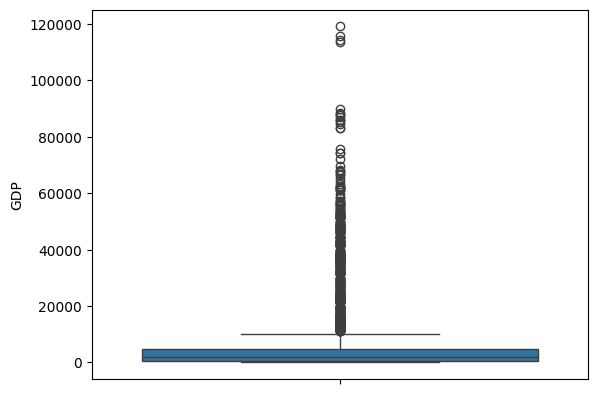

In [ ]:
#before capping the outliers
import seaborn as sns
sns.boxplot(df['GDP'])

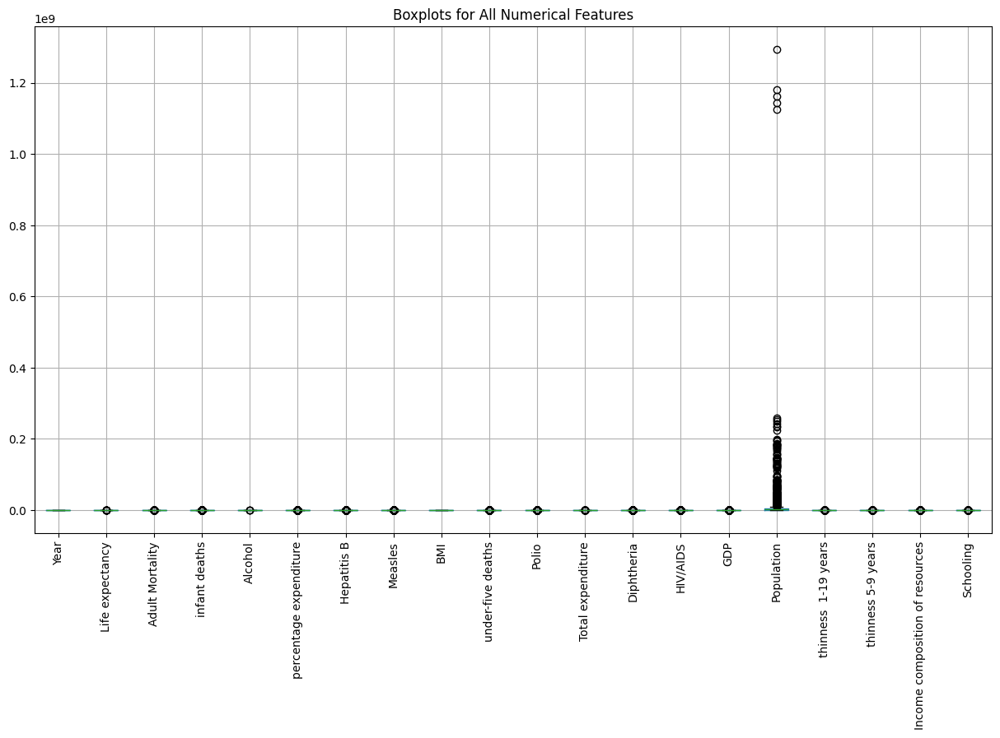

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(15, 8))
df[numerical_cols].boxplot()
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.title('Boxplots for All Numerical Features')
plt.show()

In [ ]:
df.shape

(2938, 22)

In [ ]:
# Removing outliers using IQR method for numerical columns
import numpy as np
for col in numerical_cols:
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

   # Cap the outliers instead of removing them
    df[col] = np.where(df[col] < lower_bound, lower_bound, df[col])
    df[col] = np.where(df[col] > upper_bound, upper_bound, df[col])

# Saving the cleaned data
df = df.copy()

In [ ]:
df.shape

(2938, 22)

<Axes: ylabel='GDP'>

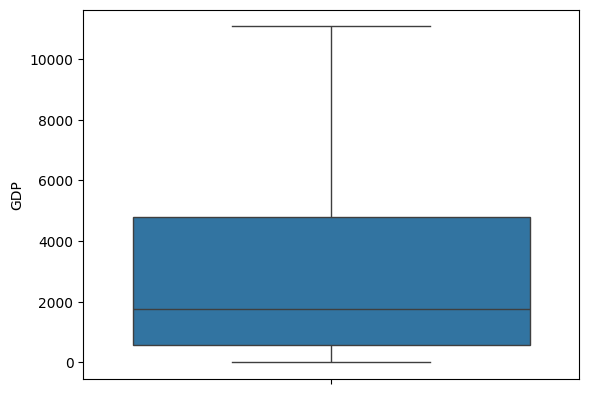

In [ ]:
#after capping the outliers
import seaborn as sns
sns.boxplot(df['GDP'])

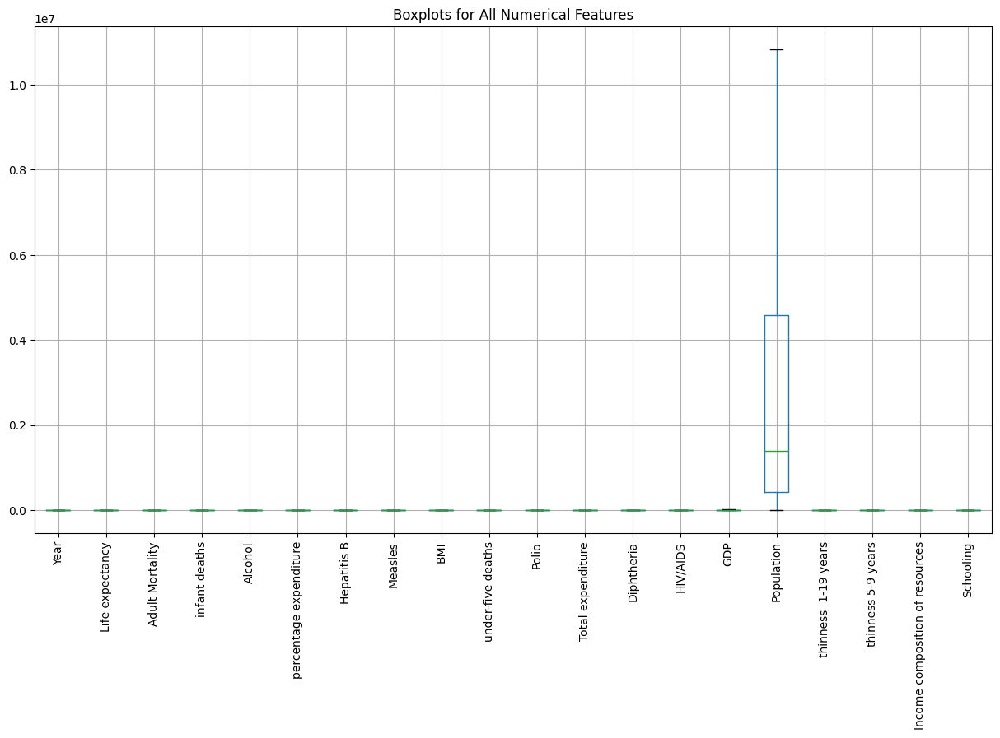

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(15, 8))
df[numerical_cols].boxplot()
plt.xticks(rotation=90)  # Rotate x-axis labels for better readability
plt.title('Boxplots for All Numerical Features')
plt.show()

In [ ]:
df.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,0,2015.0,1,65.0,263.0,55.0,0.01,71.279624,65.0,900.625,...,49.5,8.16,65.0,0.1,584.259210,10832552.25,15.35,15.6,0.479,10.1
1,0,2014.0,1,59.9,271.0,55.0,0.01,73.523582,62.0,492.000,...,58.0,8.18,62.0,0.1,612.696514,327582.00,15.35,15.6,0.476,10.0
2,0,2013.0,1,59.9,268.0,55.0,0.01,73.219243,64.0,430.000,...,62.0,8.13,64.0,0.1,631.744976,10832552.25,15.35,15.6,0.470,9.9
3,0,2012.0,1,59.5,272.0,55.0,0.01,78.184215,67.0,900.625,...,67.0,8.52,67.0,0.1,669.959000,3696958.00,15.35,15.6,0.463,9.8
4,0,2011.0,1,59.2,275.0,55.0,0.01,7.097109,68.0,900.625,...,68.0,7.87,68.0,0.1,63.537231,2978599.00,15.35,15.6,0.454,9.5


In [ ]:
#checking for duplicates
df.duplicated().sum()

0

In [ ]:
#checking for null values
print(df.isnull().sum())

Country                            0
Year                               0
Status                             0
Life expectancy                    0
Adult Mortality                    0
infant deaths                      0
Alcohol                            0
percentage expenditure             0
Hepatitis B                        0
Measles                            0
BMI                                0
under-five deaths                  0
Polio                              0
Total expenditure                  0
Diphtheria                         0
HIV/AIDS                           0
GDP                                0
Population                         0
thinness  1-19 years               0
thinness 5-9 years                 0
Income composition of resources    0
Schooling                          0
dtype: int64


In [ ]:
#using descriptive statistics to summarize the data and also ascertain what to replace the null values with
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Country,2938.0,9.509632e+01,5.624490e+01,0.000000,46.000000,9.300000e+01,1.450000e+02,1.920000e+02
Year,2938.0,2.007519e+03,4.613841e+00,2000.000000,2004.000000,2.008000e+03,2.012000e+03,2.015000e+03
Status,2938.0,8.257318e-01,3.794045e-01,0.000000,1.000000,1.000000e+00,1.000000e+00,1.000000e+00
Life expectancy,2938.0,6.924459e+01,9.481081e+00,44.600000,63.200000,7.210000e+01,7.560000e+01,8.900000e+01
Adult Mortality,2938.0,1.619534e+02,1.154885e+02,1.000000,74.000000,1.440000e+02,2.270000e+02,4.565000e+02
infant deaths,2938.0,1.363513e+01,1.910893e+01,0.000000,0.000000,3.000000e+00,2.200000e+01,5.500000e+01
Alcohol,2938.0,4.546310e+00,3.920116e+00,0.010000,1.092500,3.755000e+00,7.390000e+00,1.683625e+01
percentage expenditure,2938.0,2.840458e+02,3.894556e+02,0.000000,4.685343,6.491291e+01,4.415341e+02,1.096807e+03
Hepatitis B,2938.0,8.700885e+01,1.230895e+01,61.000000,82.000000,9.200000e+01,9.600000e+01,9.900000e+01
Measles,2938.0,2.337457e+02,3.536125e+02,0.000000,0.000000,1.700000e+01,3.602500e+02,9.006250e+02


**Checking a random column for outliers**

<Axes: ylabel='Population'>

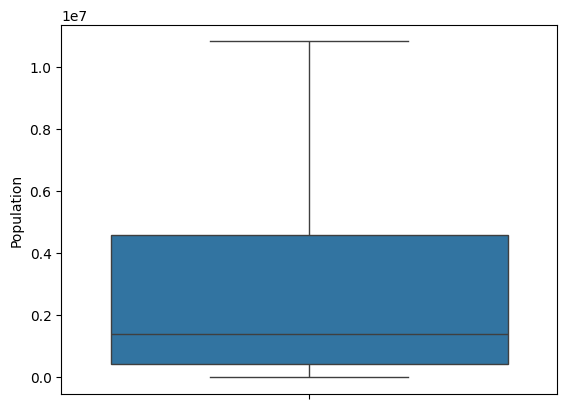

In [ ]:
import seaborn as sns
sns.boxplot(df['Population'])

**EXPLORATORY DATA ANALYSIS**

In [ ]:
df.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,0,2015.0,1,65.0,263.0,55.0,0.01,71.279624,65.0,900.625,...,49.5,8.16,65.0,0.1,584.259210,10832552.25,15.35,15.6,0.479,10.1
1,0,2014.0,1,59.9,271.0,55.0,0.01,73.523582,62.0,492.000,...,58.0,8.18,62.0,0.1,612.696514,327582.00,15.35,15.6,0.476,10.0
2,0,2013.0,1,59.9,268.0,55.0,0.01,73.219243,64.0,430.000,...,62.0,8.13,64.0,0.1,631.744976,10832552.25,15.35,15.6,0.470,9.9
3,0,2012.0,1,59.5,272.0,55.0,0.01,78.184215,67.0,900.625,...,67.0,8.52,67.0,0.1,669.959000,3696958.00,15.35,15.6,0.463,9.8
4,0,2011.0,1,59.2,275.0,55.0,0.01,7.097109,68.0,900.625,...,68.0,7.87,68.0,0.1,63.537231,2978599.00,15.35,15.6,0.454,9.5


In [ ]:
df.shape

(2938, 22)

**UNIVARIATE ANALYSIS**

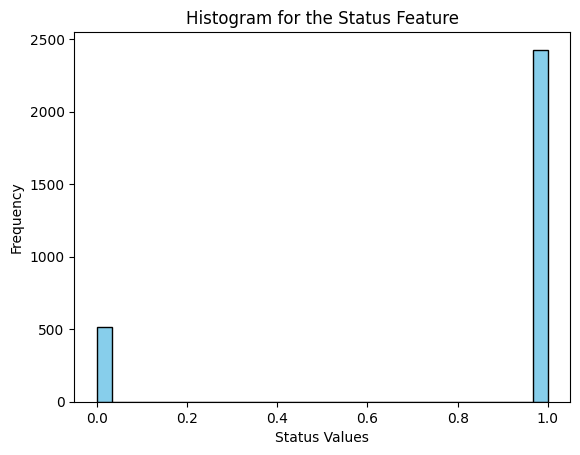

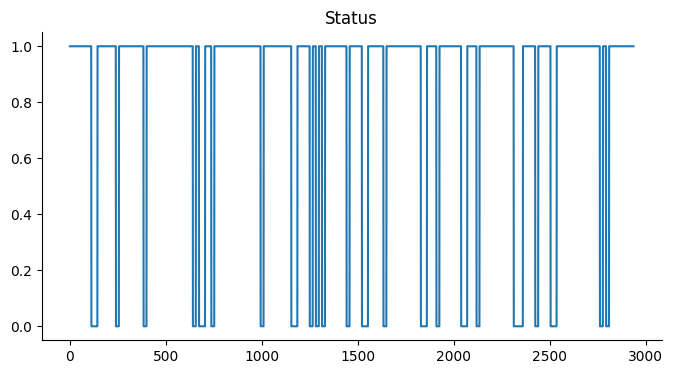

In [ ]:
import matplotlib.pyplot as plt
#Starting with status column
plt.hist(df['Status'], bins=30, color='skyblue', edgecolor='black')
plt.xlabel('Status Values')
plt.ylabel('Frequency')
plt.title('Histogram for the Status Feature')
plt.show()

# @title Status Column

from matplotlib import pyplot as plt
df['Status'].plot(kind='line', figsize=(8, 4), title='Status')
plt.gca().spines[['top', 'right']].set_visible(False)

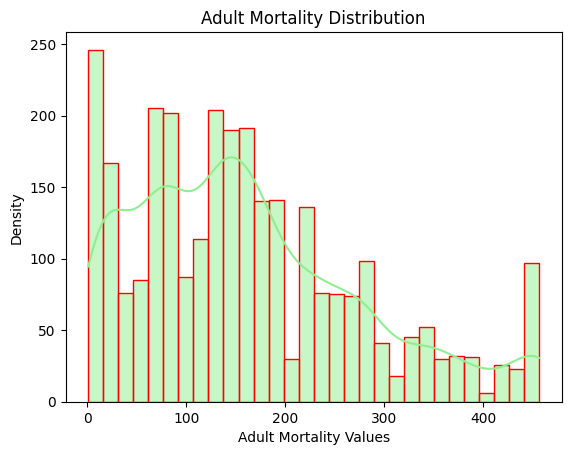

<Axes: ylabel='Adult Mortality'>

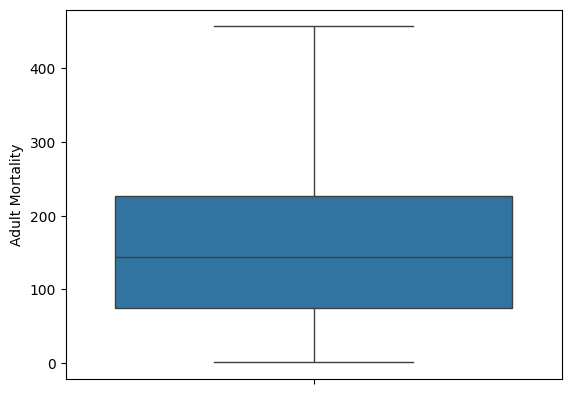

In [ ]:
# @title Adult Mortality Column
#Adult Mortality
sns.histplot(df['Adult Mortality'], bins=30, kde=True, color='lightgreen', edgecolor='red')
# Adding labels and title
plt.xlabel('Adult Mortality Values')
plt.ylabel('Density')
plt.title('Adult Mortality Distribution')

# Display the plot
plt.show()

sns.boxplot(df['Adult Mortality'])

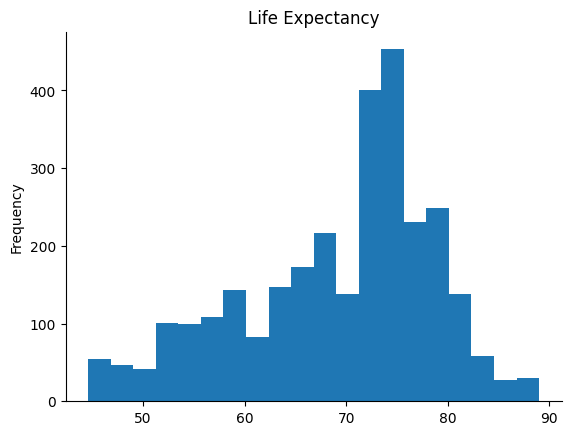

In [ ]:
#life Expectancy

from matplotlib import pyplot as plt
df['Life expectancy'].plot(kind='hist', bins=20, title='Life Expectancy')
plt.gca().spines[['top', 'right',]].set_visible(False)

In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Country,2938.0,9.509632e+01,5.624490e+01,0.000000,46.000000,9.300000e+01,1.450000e+02,1.920000e+02
Year,2938.0,2.007519e+03,4.613841e+00,2000.000000,2004.000000,2.008000e+03,2.012000e+03,2.015000e+03
Status,2938.0,8.257318e-01,3.794045e-01,0.000000,1.000000,1.000000e+00,1.000000e+00,1.000000e+00
Life expectancy,2938.0,6.924459e+01,9.481081e+00,44.600000,63.200000,7.210000e+01,7.560000e+01,8.900000e+01
Adult Mortality,2938.0,1.619534e+02,1.154885e+02,1.000000,74.000000,1.440000e+02,2.270000e+02,4.565000e+02
infant deaths,2938.0,1.363513e+01,1.910893e+01,0.000000,0.000000,3.000000e+00,2.200000e+01,5.500000e+01
Alcohol,2938.0,4.546310e+00,3.920116e+00,0.010000,1.092500,3.755000e+00,7.390000e+00,1.683625e+01
percentage expenditure,2938.0,2.840458e+02,3.894556e+02,0.000000,4.685343,6.491291e+01,4.415341e+02,1.096807e+03
Hepatitis B,2938.0,8.700885e+01,1.230895e+01,61.000000,82.000000,9.200000e+01,9.600000e+01,9.900000e+01
Measles,2938.0,2.337457e+02,3.536125e+02,0.000000,0.000000,1.700000e+01,3.602500e+02,9.006250e+02


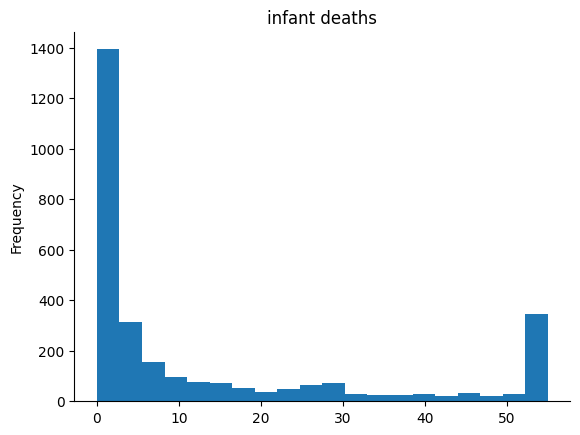

In [ ]:
# @title infant deaths

from matplotlib import pyplot as plt
df['infant deaths'].plot(kind='hist', bins=20, title='infant deaths')
plt.gca().spines[['top', 'right',]].set_visible(False)

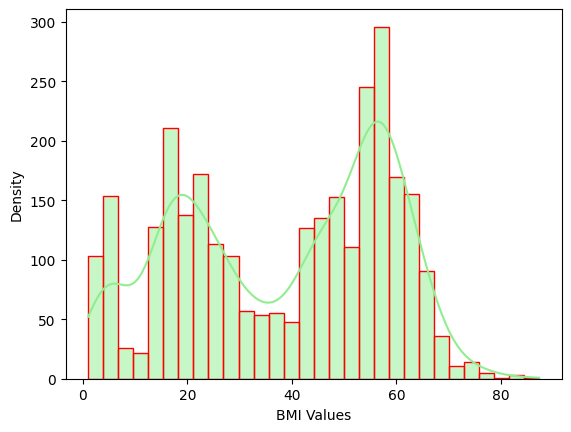

In [ ]:
# @title BMI Column
sns.histplot(df['BMI'], bins=30, kde=True, color='lightgreen', edgecolor='red')
# Adding labels and title
plt.xlabel('BMI Values')
plt.ylabel('Density')
plt.show()

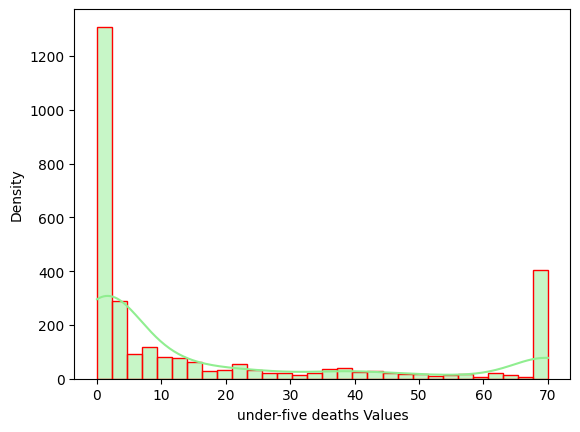

In [ ]:
# @title under-five deaths
sns.histplot(df['under-five deaths'], bins=30, kde=True, color='lightgreen', edgecolor='red')
# Adding labels and title
plt.xlabel('under-five deaths Values')
plt.ylabel('Density')
plt.show()

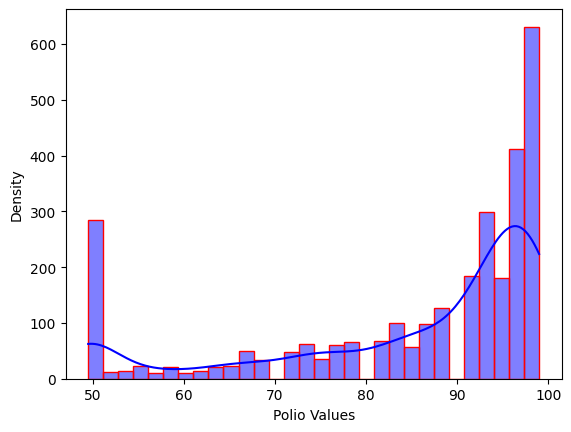

In [ ]:
# @title Polio
sns.histplot(df['Polio'], bins=30, kde=True, color='blue', edgecolor='red')
# Adding labels and title
plt.xlabel('Polio Values')
plt.ylabel('Density')
plt.show()

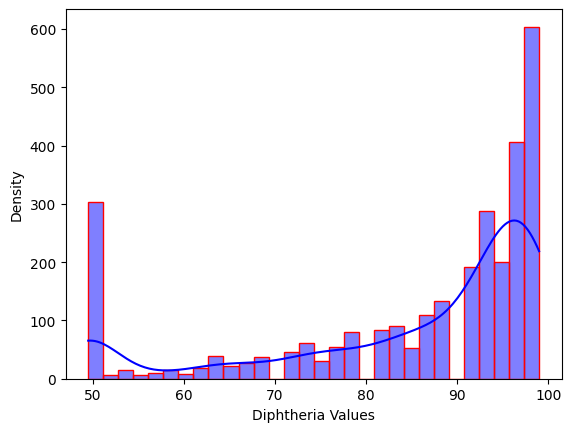

In [ ]:
# @title Diphtheria
sns.histplot(df['Diphtheria'], bins=30, kde=True, color='blue', edgecolor='red')
# Adding labels and title
plt.xlabel('Diphtheria Values')
plt.ylabel('Density')
plt.show()

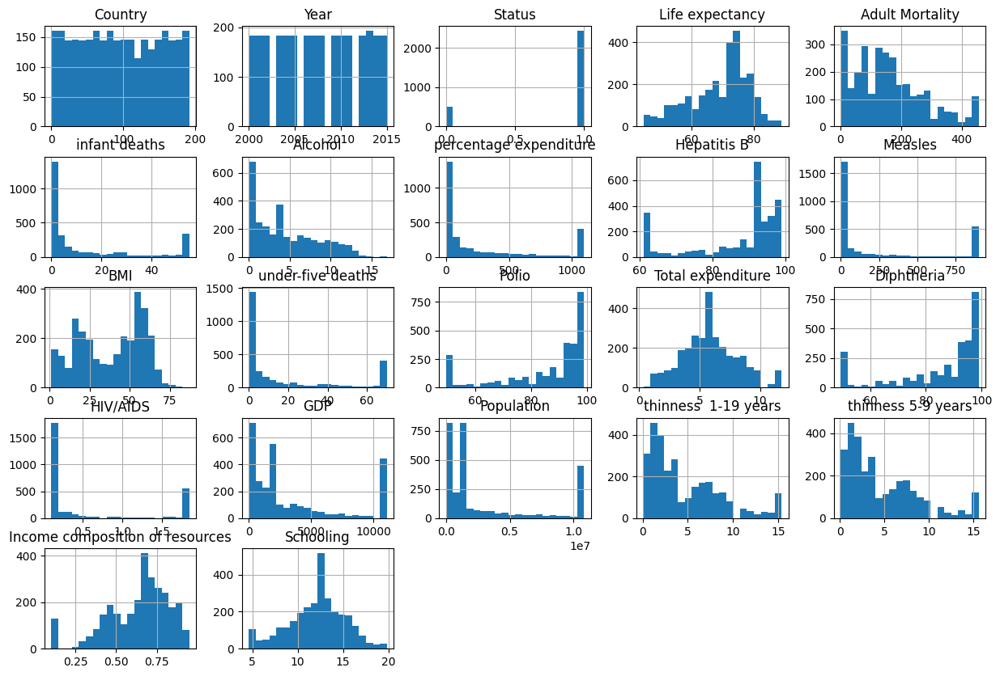

In [ ]:
import matplotlib.pyplot as plt
df.hist(bins=20, figsize=(15, 10))
plt.show()

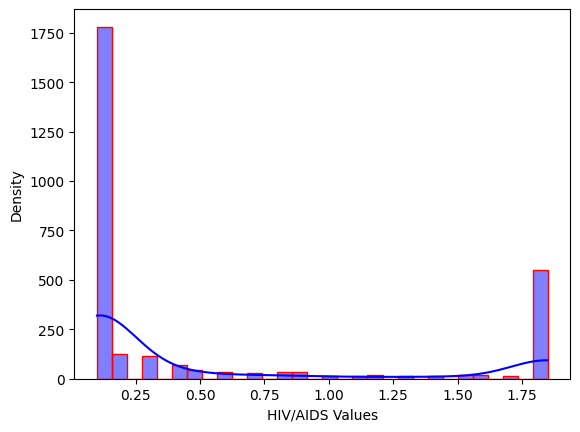

In [ ]:
# @title HIV/AIDS
sns.histplot(df['HIV/AIDS'], bins=30, kde=True, color='blue', edgecolor='red')
# Adding labels and title
plt.xlabel('HIV/AIDS Values')
plt.ylabel('Density')
plt.show()

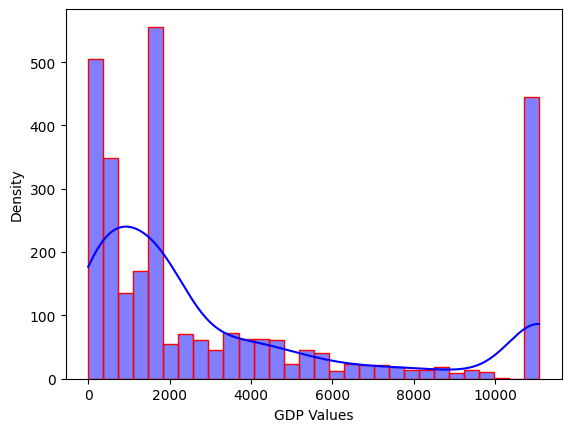

In [ ]:
# @title GDP
sns.histplot(df['GDP'], bins=30, kde=True, color='blue', edgecolor='red')
# Adding labels and title
plt.xlabel('GDP Values')
plt.ylabel('Density')
plt.show()

In [ ]:
df.columns

Index(['Country', 'Year', 'Status', 'Life expectancy', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles', 'BMI', 'under-five deaths', 'Polio', 'Total expenditure',
       'Diphtheria', 'HIV/AIDS', 'GDP', 'Population', 'thinness  1-19 years',
       'thinness 5-9 years', 'Income composition of resources', 'Schooling'],
      dtype='object')

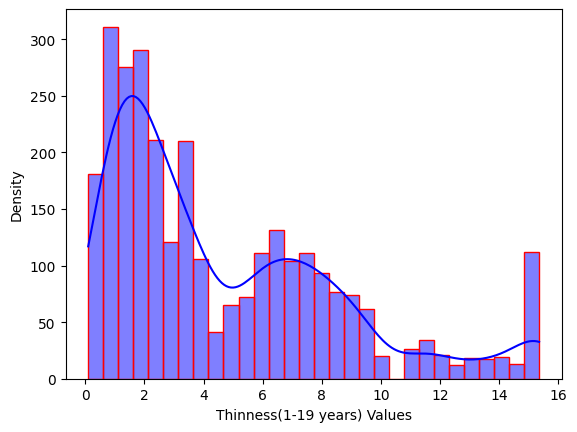

In [ ]:
#Thinness(1-19 years)
# @title Thinness(1-19 years)
sns.histplot(df['thinness  1-19 years'], bins=30, kde=True, color='blue', edgecolor='red')
# Adding labels and title
plt.xlabel('Thinness(1-19 years) Values')
plt.ylabel('Density')
plt.show()

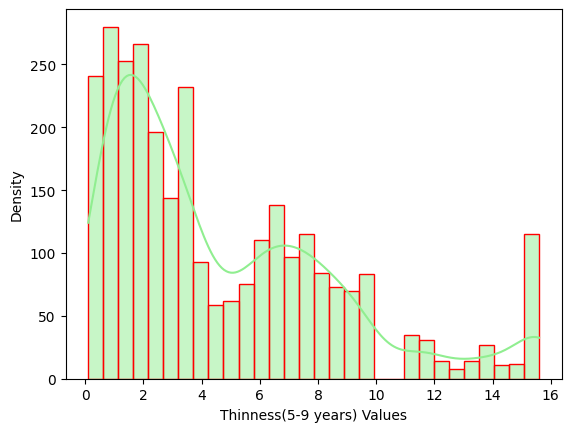

In [ ]:
# @title Thinness(5-9 years)
sns.histplot(df['thinness 5-9 years'], bins=30, kde=True, color='lightgreen', edgecolor='red')
# Adding labels and title
plt.xlabel('Thinness(5-9 years) Values')
plt.ylabel('Density')
plt.show()

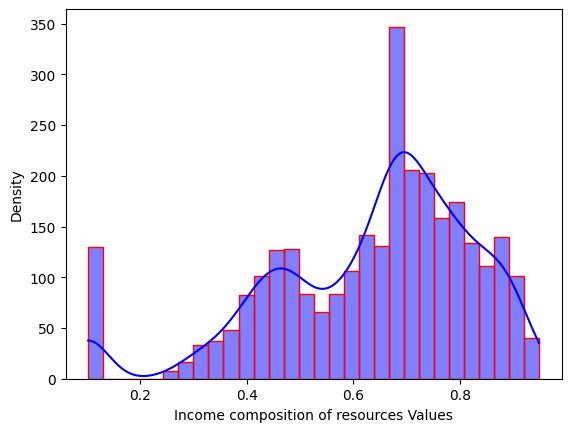

In [ ]:
# @title Income composition of resources
sns.histplot(df['Income composition of resources'], bins=30, kde=True, color='blue', edgecolor='red')
# Adding labels and title
plt.xlabel('Income composition of resources Values')
plt.ylabel('Density')
plt.show()

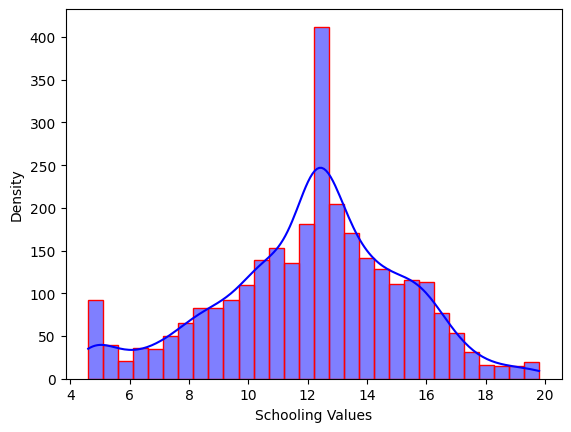

In [ ]:
# @title Schooling
sns.histplot(df['Schooling'], bins=30, kde=True, color='blue', edgecolor='red')
# Adding labels and title
plt.xlabel('Schooling Values')
plt.ylabel('Density')
plt.show()

**Bivaraite and Multivariate Analysis**

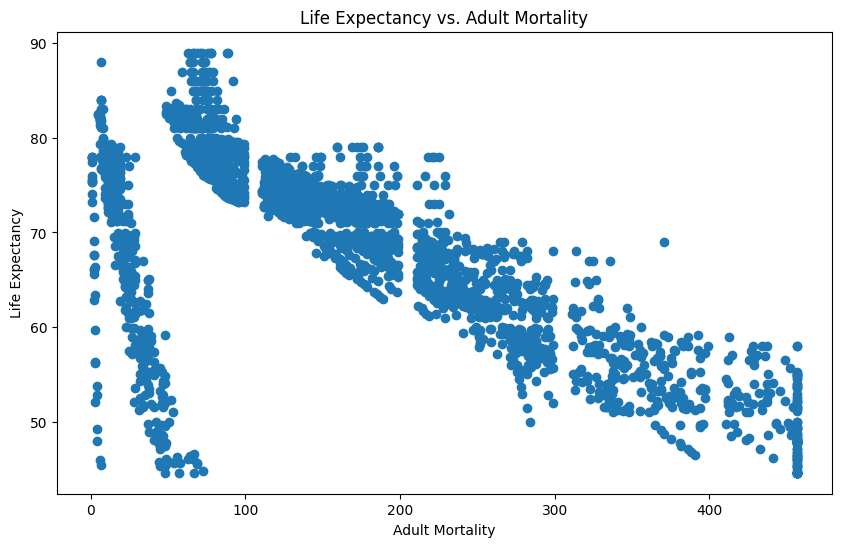

In [ ]:
# @title Life Expectancy vs. Adult Mortality
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(df['Adult Mortality'], df['Life expectancy'])
plt.xlabel('Adult Mortality')
plt.ylabel('Life Expectancy')
_ = plt.title('Life Expectancy vs. Adult Mortality')

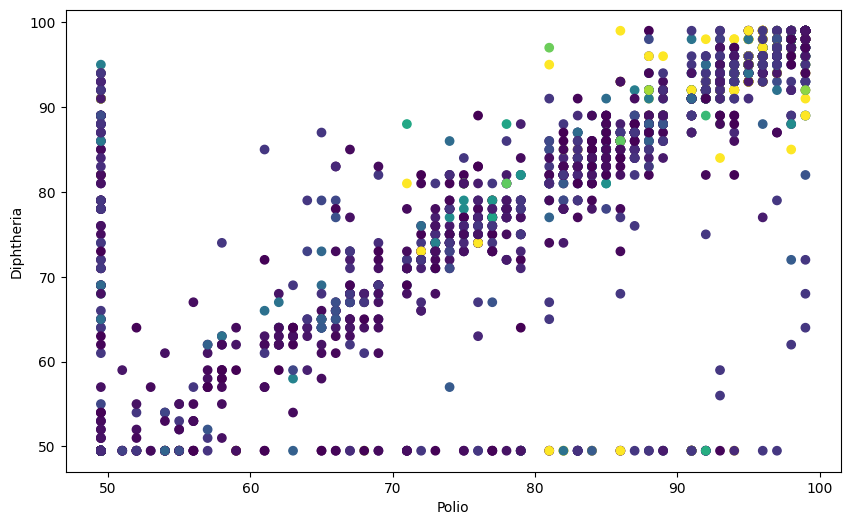

In [ ]:
# @title Polio vs Diphtheria Vaccination Rates

import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
plt.scatter(df['Polio'], df['Diphtheria'], c=df['GDP'])
plt.xlabel('Polio')
_ = plt.ylabel('Diphtheria')

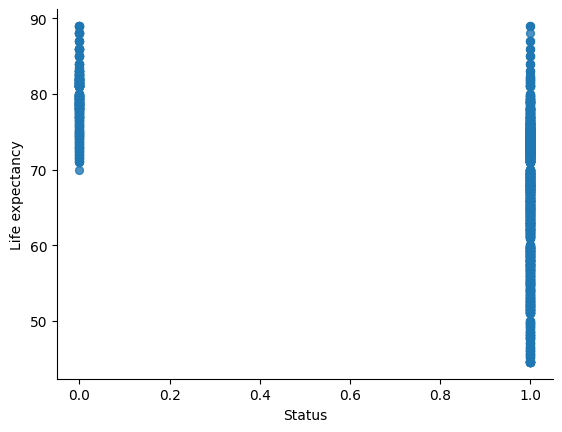

In [ ]:
# @title Status vs Life Expectancy

from matplotlib import pyplot as plt
df.plot(kind='scatter', x='Status', y='Life expectancy', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

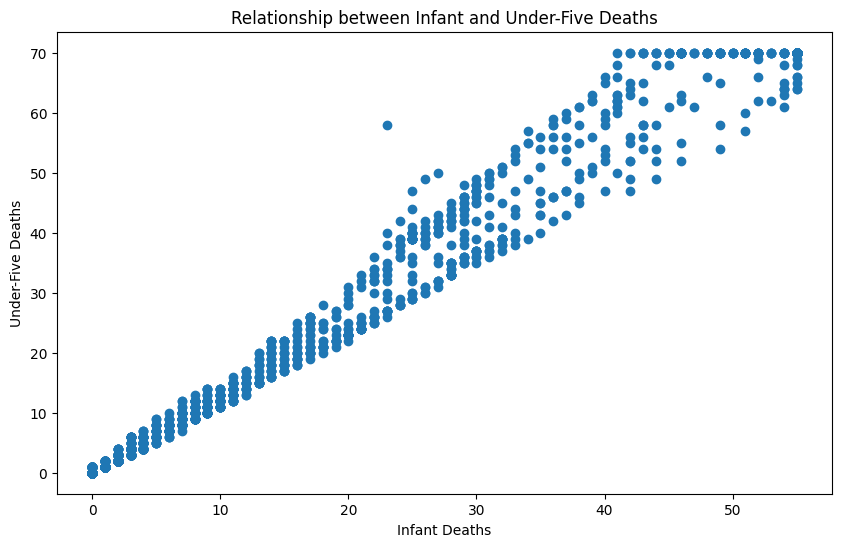

In [ ]:
# @title Relationship between Infant and Under-Five Deaths

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(df['infant deaths'], df['under-five deaths'])
plt.xlabel('Infant Deaths')
plt.ylabel('Under-Five Deaths')
_ = plt.title('Relationship between Infant and Under-Five Deaths')

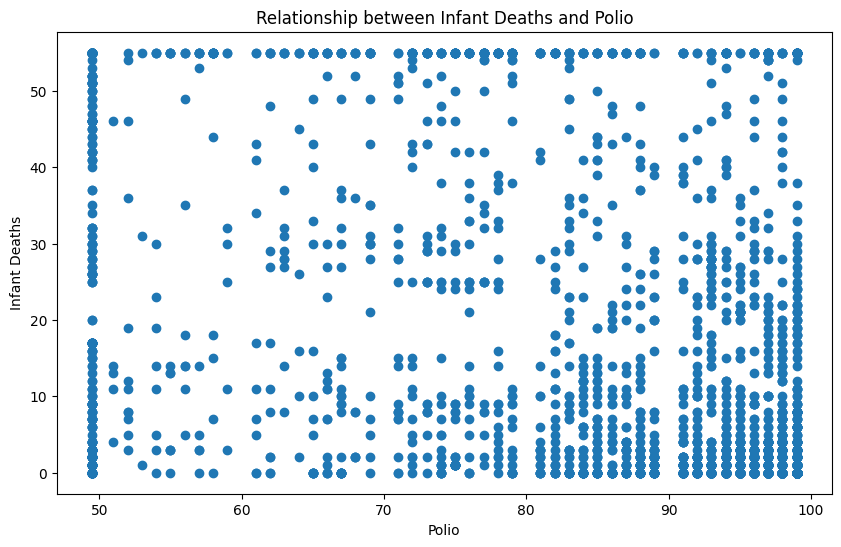

In [ ]:
# @title Relationship between Infant and Polio

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(df['Polio'], df['infant deaths'])
plt.xlabel('Polio')
plt.ylabel('Infant Deaths')
_ = plt.title('Relationship between Infant Deaths and Polio')

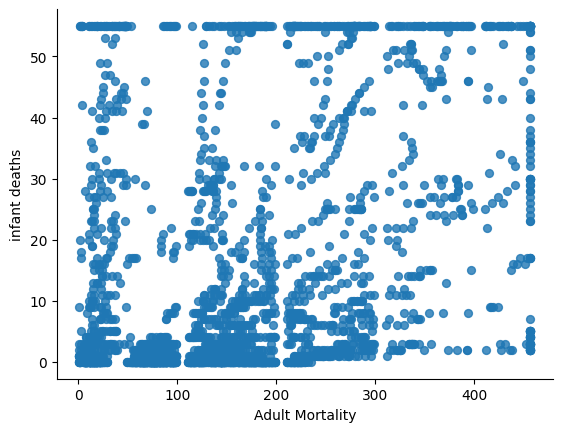

In [ ]:
# @title Adult Mortality vs infant deaths

from matplotlib import pyplot as plt
df.plot(kind='scatter', x='Adult Mortality', y='infant deaths', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

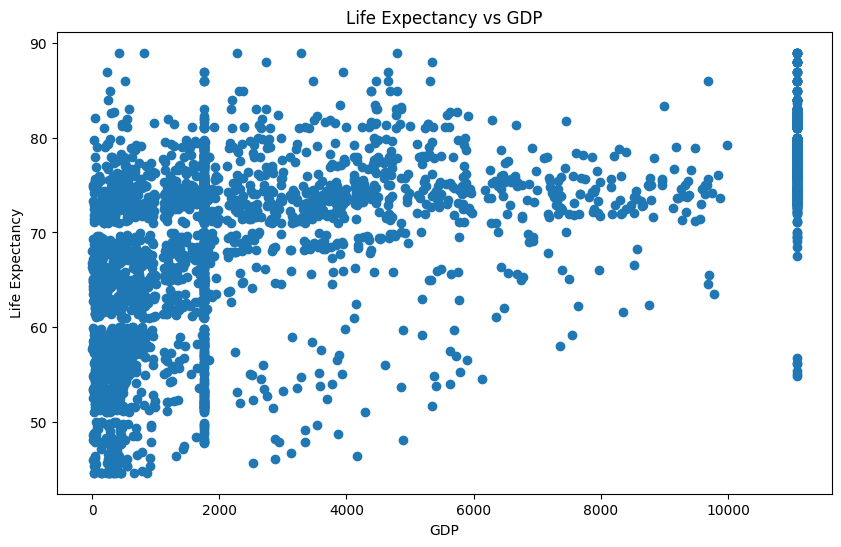

In [ ]:
# @title Life Expectancy vs GDP

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(df['GDP'], df['Life expectancy'])
plt.xlabel('GDP')
plt.ylabel('Life Expectancy')
_ = plt.title('Life Expectancy vs GDP')

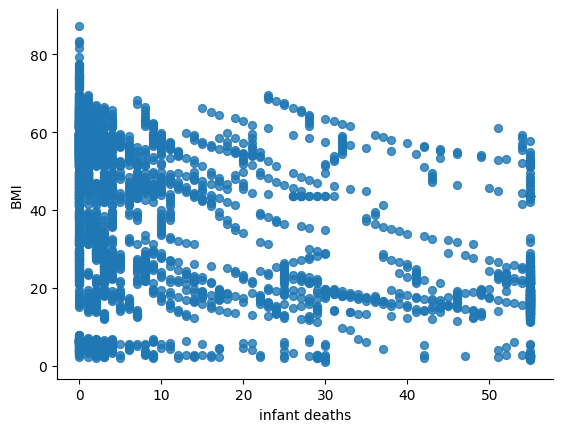

In [ ]:
# @title infant deaths vs BMI

from matplotlib import pyplot as plt
df.plot(kind='scatter', x='infant deaths', y='BMI', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

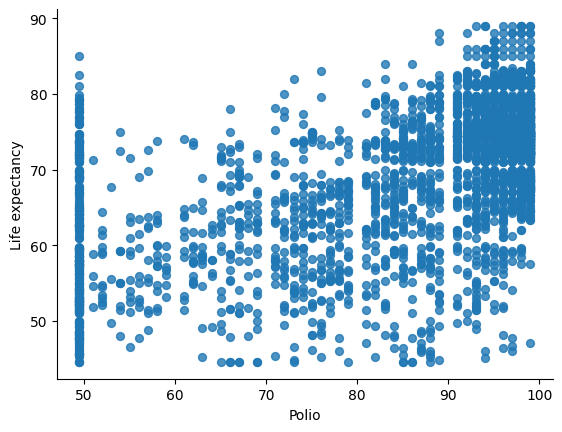

In [ ]:
# @title Polio vs Life Expectancy

from matplotlib import pyplot as plt
df.plot(kind='scatter', x='Polio', y='Life expectancy', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

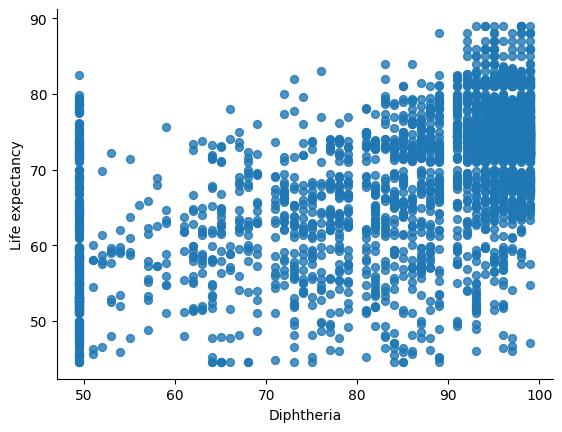

In [ ]:
# @title Diptheria vs Life Expectancy

from matplotlib import pyplot as plt
df.plot(kind='scatter', x='Diphtheria', y='Life expectancy', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

functools.partial(<function SpinesProxy.__getattr__.<locals>.x at 0x7a4243c068c0>, [<matplotlib.spines.Spine object at 0x7a4243b6c670>, <matplotlib.spines.Spine object at 0x7a4243b6c850>], 'set_visible')

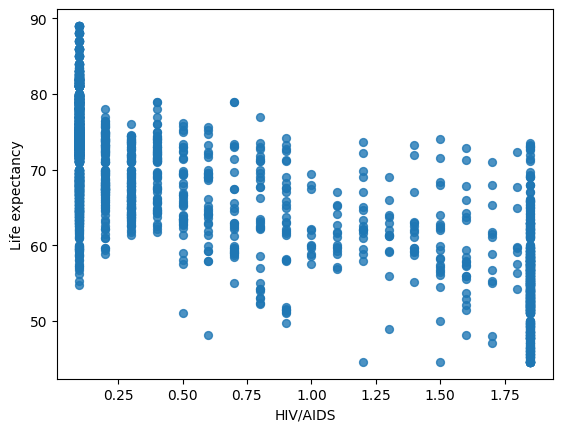

In [ ]:
# @title HIV/AIDs vs Life Expectancy

from matplotlib import pyplot as plt
df.plot(kind='scatter', x='HIV/AIDS', y='Life expectancy', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible

functools.partial(<function SpinesProxy.__getattr__.<locals>.x at 0x7a4243ba1990>, [<matplotlib.spines.Spine object at 0x7a4243b23c10>, <matplotlib.spines.Spine object at 0x7a4243b22770>], 'set_visible')

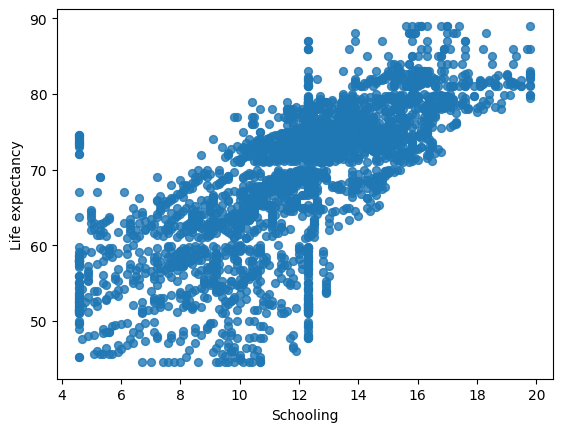

In [ ]:
# @title Schooling vs Life Expectancy

from matplotlib import pyplot as plt
df.plot(kind='scatter', x='Schooling', y='Life expectancy', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible

functools.partial(<function SpinesProxy.__getattr__.<locals>.x at 0x7a4243a189d0>, [<matplotlib.spines.Spine object at 0x7a4243be5cc0>, <matplotlib.spines.Spine object at 0x7a4243be5ea0>], 'set_visible')

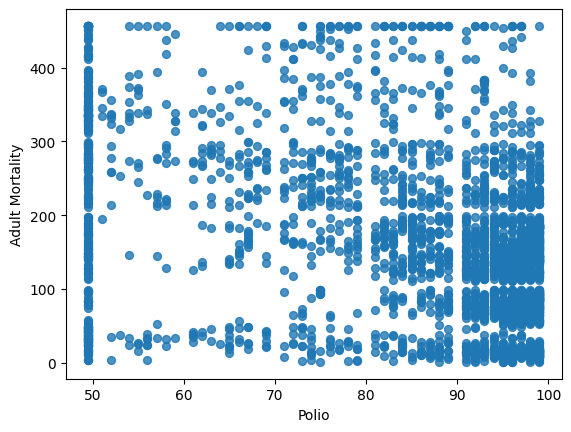

In [ ]:
# @title Adult Mortality vs Polio

from matplotlib import pyplot as plt
df.plot(kind='scatter', x='Polio', y='Adult Mortality', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible

functools.partial(<function SpinesProxy.__getattr__.<locals>.x at 0x7a4243a903a0>, [<matplotlib.spines.Spine object at 0x7a4243a58850>, <matplotlib.spines.Spine object at 0x7a4243a58a30>], 'set_visible')

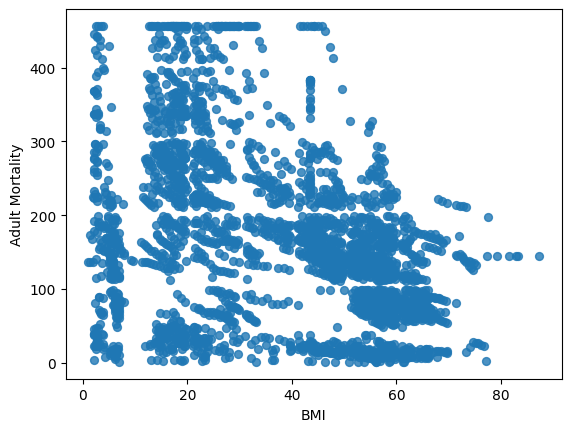

In [ ]:
# @title Adult Mortality vs BMI

from matplotlib import pyplot as plt
df.plot(kind='scatter', x='BMI', y='Adult Mortality', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible

functools.partial(<function SpinesProxy.__getattr__.<locals>.x at 0x7a4243b248b0>, [<matplotlib.spines.Spine object at 0x7a4243aaf670>, <matplotlib.spines.Spine object at 0x7a4243aaf850>], 'set_visible')

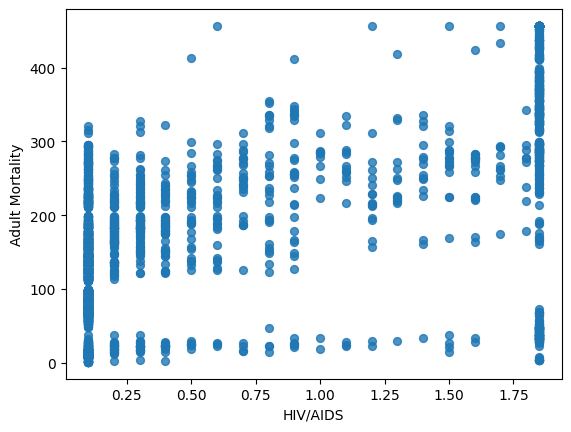

In [ ]:
# @title Adult Mortality vs HIV/AIDS

from matplotlib import pyplot as plt
df.plot(kind='scatter', x='HIV/AIDS', y='Adult Mortality', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible

In [ ]:
df.columns

Index(['Country', 'Year', 'Status', 'Life expectancy', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles', 'BMI', 'under-five deaths', 'Polio', 'Total expenditure',
       'Diphtheria', 'HIV/AIDS', 'GDP', 'Population', 'thinness  1-19 years',
       'thinness 5-9 years', 'Income composition of resources', 'Schooling'],
      dtype='object')

functools.partial(<function SpinesProxy.__getattr__.<locals>.x at 0x7a4243d1d6c0>, [<matplotlib.spines.Spine object at 0x7a4243cb0100>, <matplotlib.spines.Spine object at 0x7a4243cb1900>], 'set_visible')

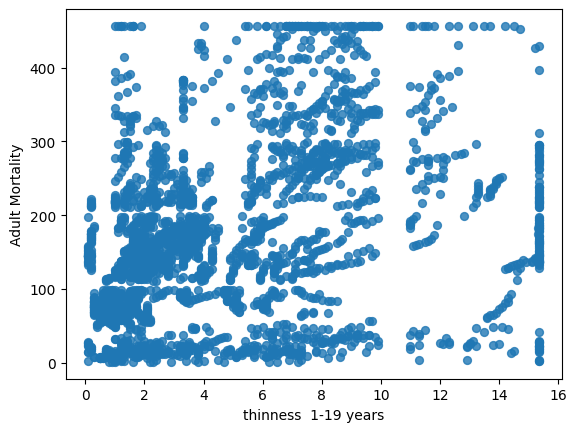

In [ ]:
# @title Adult Mortality vs Thinness(1-19 years)

from matplotlib import pyplot as plt
df.plot(kind='scatter', x='thinness  1-19 years', y='Adult Mortality', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible

functools.partial(<function SpinesProxy.__getattr__.<locals>.x at 0x7a4243ecbac0>, [<matplotlib.spines.Spine object at 0x7a4243d94370>, <matplotlib.spines.Spine object at 0x7a4243db8700>], 'set_visible')

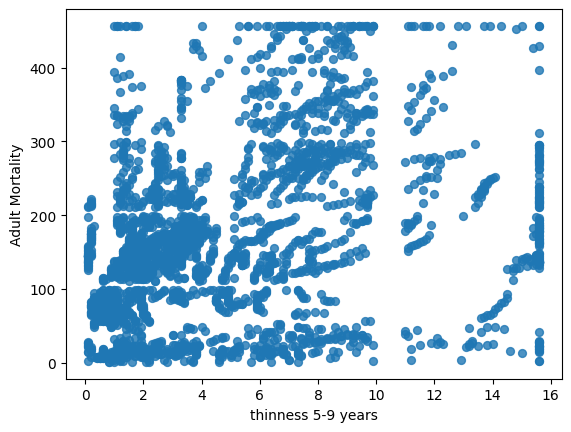

In [ ]:
# @title Adult Mortality vs Thinness(5-9 years)

from matplotlib import pyplot as plt
df.plot(kind='scatter', x='thinness 5-9 years', y='Adult Mortality', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible

functools.partial(<function SpinesProxy.__getattr__.<locals>.x at 0x7a424c1bf7f0>, [<matplotlib.spines.Spine object at 0x7a4243ef88b0>, <matplotlib.spines.Spine object at 0x7a4243ef82b0>], 'set_visible')

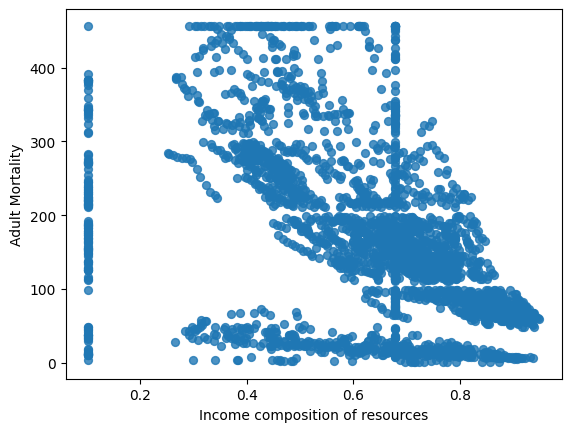

In [ ]:
# @title Adult Mortality vs Income composition of resources

from matplotlib import pyplot as plt
df.plot(kind='scatter', x='Income composition of resources', y='Adult Mortality', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible

functools.partial(<function SpinesProxy.__getattr__.<locals>.x at 0x7a42483bb1c0>, [<matplotlib.spines.Spine object at 0x7a4243f120e0>, <matplotlib.spines.Spine object at 0x7a4243f11ba0>], 'set_visible')

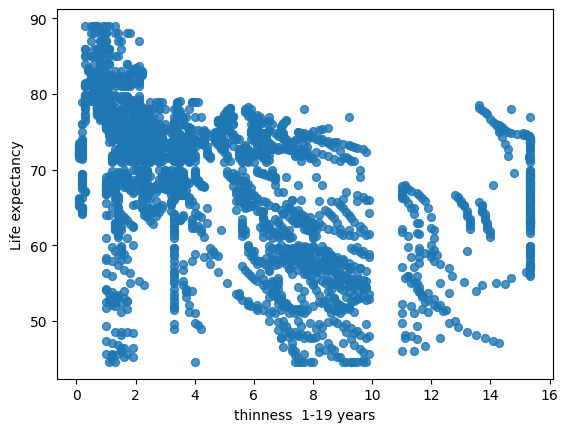

In [ ]:
# @title Thinness(1-19 years)  vs Life Expectancy
from matplotlib import pyplot as plt
df.plot(kind='scatter', x='thinness  1-19 years', y='Life expectancy', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible

In [ ]:
# @title MULTIVARIATE ANALYSIS

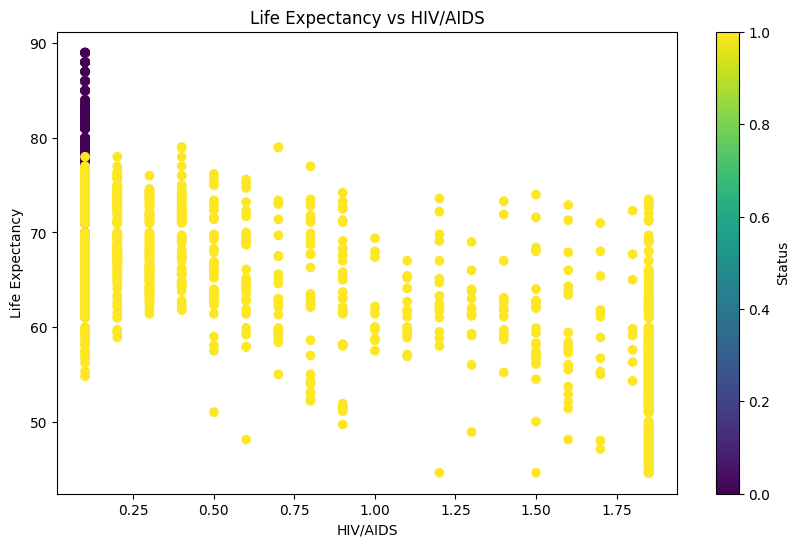

In [ ]:
# @title Life Expectancy vs HIV/AIDS with Status

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(df['HIV/AIDS'], df['Life expectancy'], c=df['Status'], cmap='viridis')
plt.xlabel('HIV/AIDS')
plt.ylabel('Life Expectancy')
plt.title('Life Expectancy vs HIV/AIDS')
_ = plt.colorbar(label='Status')

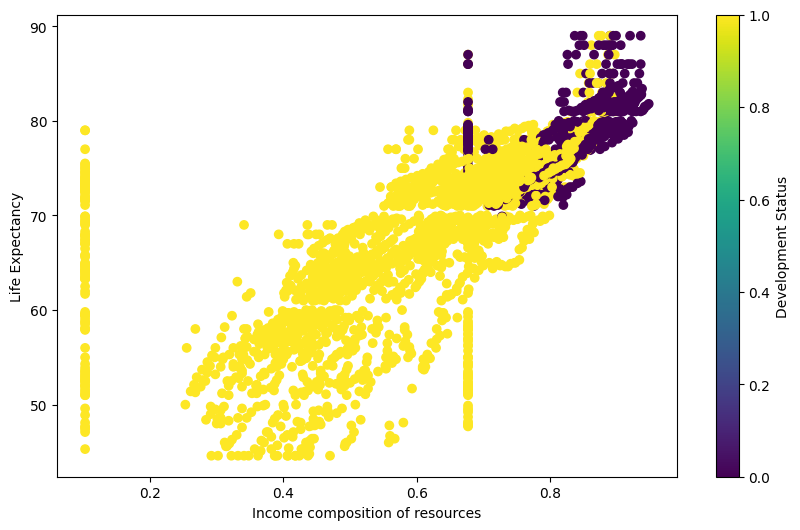

In [ ]:
# @title Income Composition of Resources vs. Life Expectancy by Development Status

import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
plt.scatter(df['Income composition of resources'], df['Life expectancy'], c=df['Status'], cmap='viridis')
plt.xlabel('Income composition of resources')
plt.ylabel('Life Expectancy')
_ = plt.colorbar(label='Development Status')

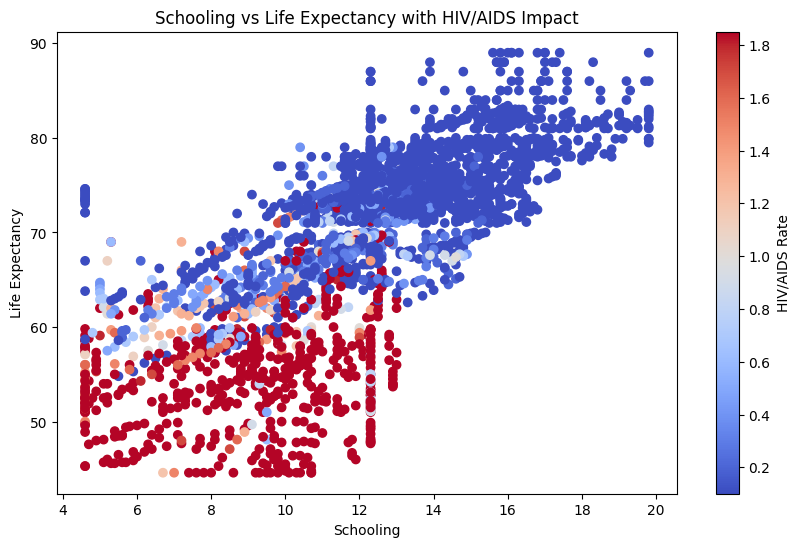

In [ ]:
# @title Schooling vs Life Expectancy with HIV/AIDS Impact

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(df['Schooling'], df['Life expectancy'], c=df['HIV/AIDS'], cmap='coolwarm')
plt.xlabel('Schooling')
plt.ylabel('Life Expectancy')
plt.title('Schooling vs Life Expectancy with HIV/AIDS Impact')
_ = plt.colorbar(label='HIV/AIDS Rate')

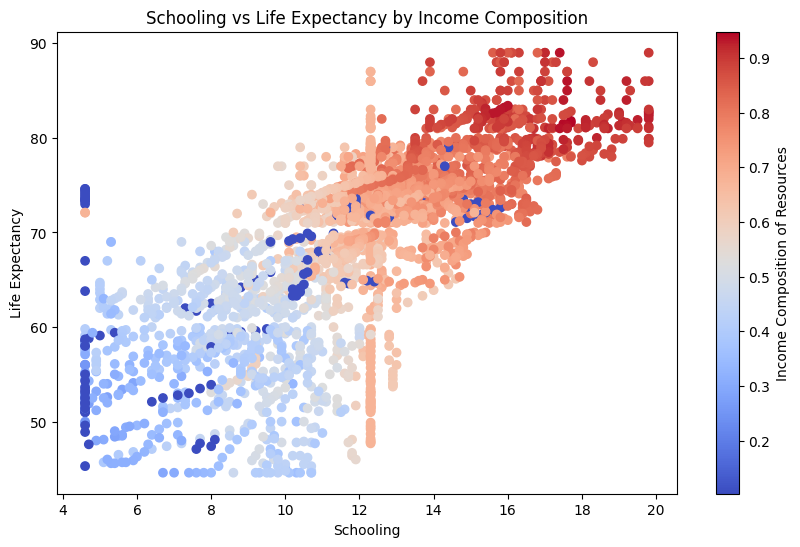

In [ ]:
# @title Schooling vs Life Expectancy by Income Composition
plt.figure(figsize=(10, 6))
plt.scatter(df['Schooling'], df['Life expectancy'], c=df['Income composition of resources'], cmap='coolwarm')
plt.xlabel('Schooling')
plt.ylabel('Life Expectancy')
plt.title('Schooling vs Life Expectancy by Income Composition')
_ = plt.colorbar(label='Income Composition of Resources')

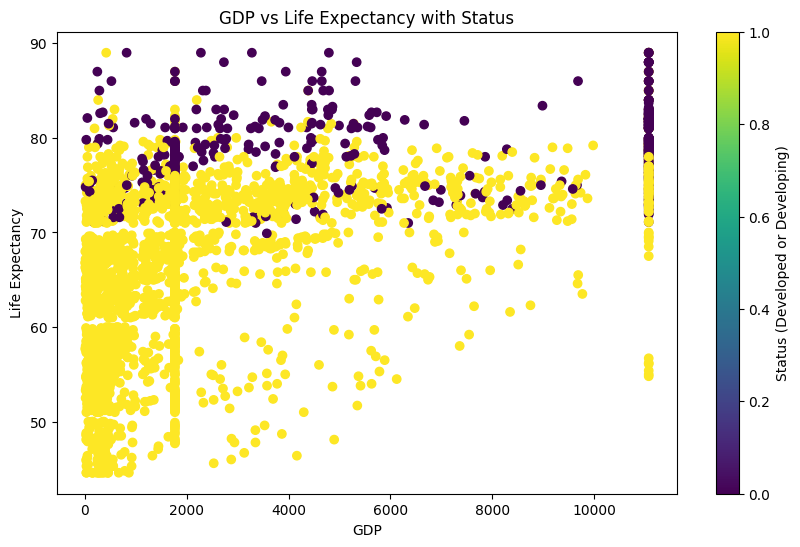

In [ ]:
# @title GDP vs Life Expectancy with Status of a Country

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(df['GDP'], df['Life expectancy'], c=df['Status'], cmap='viridis')
plt.xlabel('GDP')
plt.ylabel('Life Expectancy')
plt.title('GDP vs Life Expectancy with Status')
_ = plt.colorbar(label='Status (Developed or Developing)')

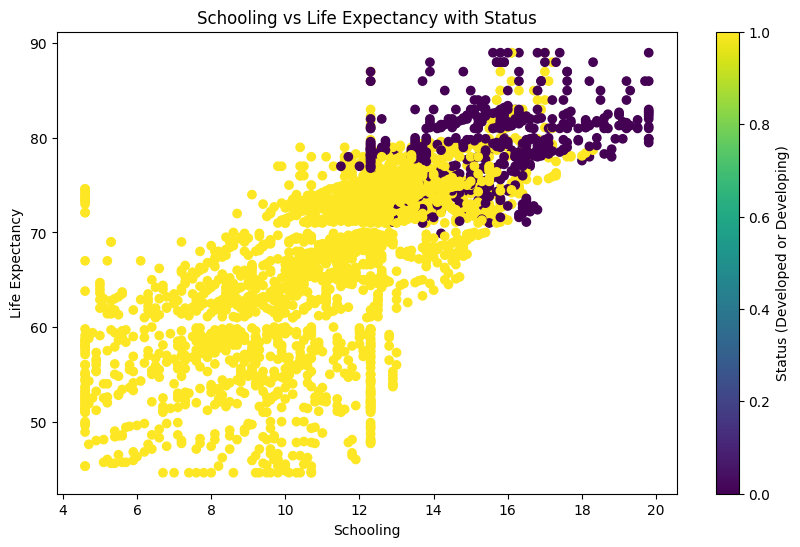

In [ ]:
# @title Schooling vs Life Expectancy with Status of a Country

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(df['Schooling'], df['Life expectancy'], c=df['Status'], cmap='viridis')
plt.xlabel('Schooling')
plt.ylabel('Life Expectancy')
plt.title('Schooling vs Life Expectancy with Status')
_ = plt.colorbar(label='Status (Developed or Developing)')

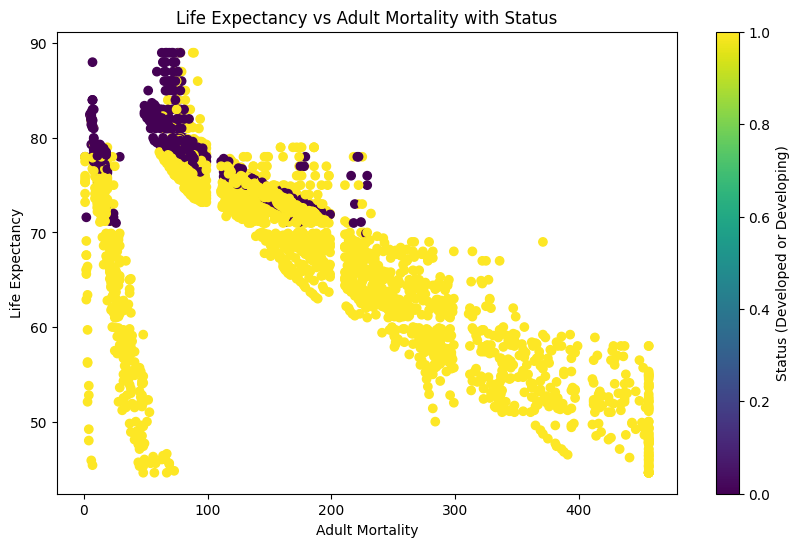

In [ ]:
# @title Life Expectancy vs Adult Mortality with Status of a Country

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(df['Adult Mortality'], df['Life expectancy'], c=df['Status'], cmap='viridis')
plt.xlabel('Adult Mortality')
plt.ylabel('Life Expectancy')
plt.title('Life Expectancy vs Adult Mortality with Status')
_ = plt.colorbar(label='Status (Developed or Developing)')

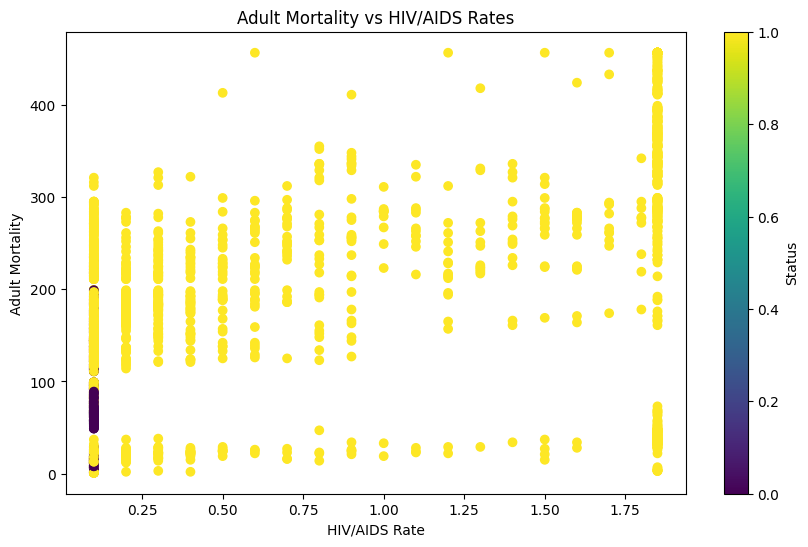

In [ ]:
# @title Adult Mortality vs HIV/AIDS Rates with Status

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(df['HIV/AIDS'], df['Adult Mortality'], c=df['Status'], cmap='viridis')
plt.xlabel('HIV/AIDS Rate')
plt.ylabel('Adult Mortality')
plt.title('Adult Mortality vs HIV/AIDS Rates')
_ = plt.colorbar(label='Status')

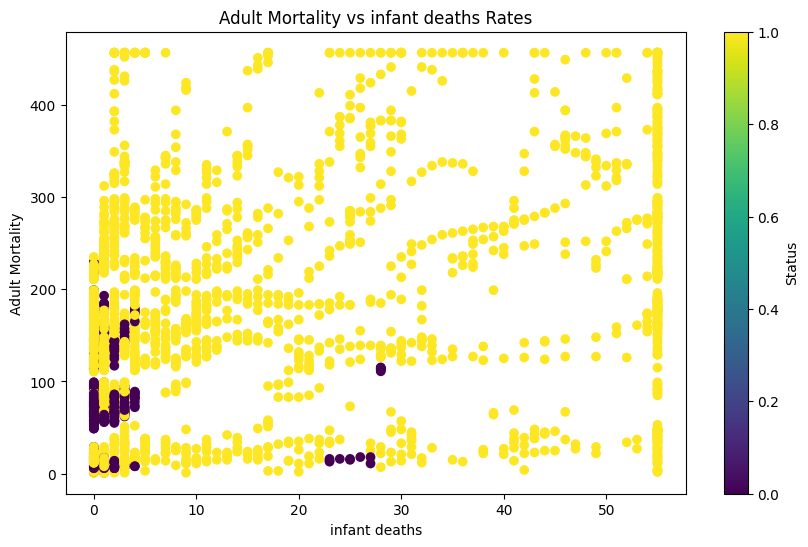

In [ ]:
# @title Adult Mortality vs infant deaths Rates with Status

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(df['infant deaths'], df['Adult Mortality'], c=df['Status'], cmap='viridis')
plt.xlabel('infant deaths')
plt.ylabel('Adult Mortality')
plt.title('Adult Mortality vs infant deaths Rates')
_ = plt.colorbar(label='Status')

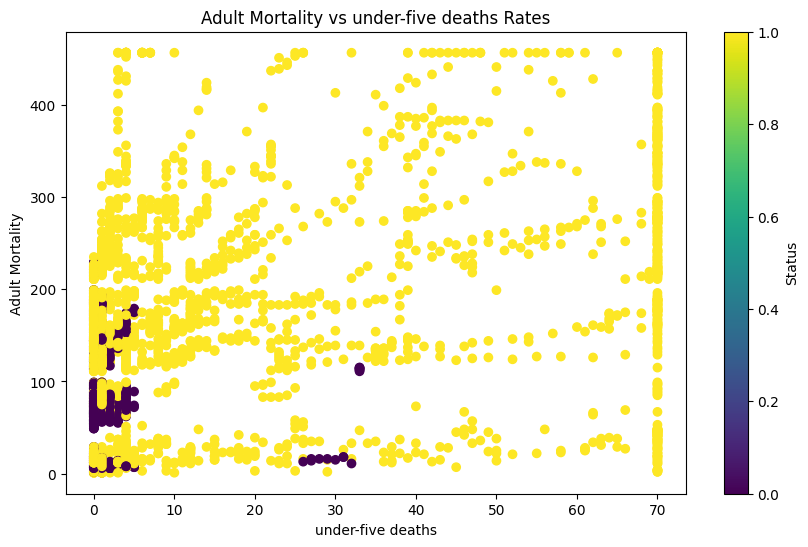

In [ ]:
# @title Adult Mortality vs under-five deaths Rates with Status

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(df['under-five deaths'], df['Adult Mortality'], c=df['Status'], cmap='viridis')
plt.xlabel('under-five deaths')
plt.ylabel('Adult Mortality')
plt.title('Adult Mortality vs under-five deaths Rates')
_ = plt.colorbar(label='Status')

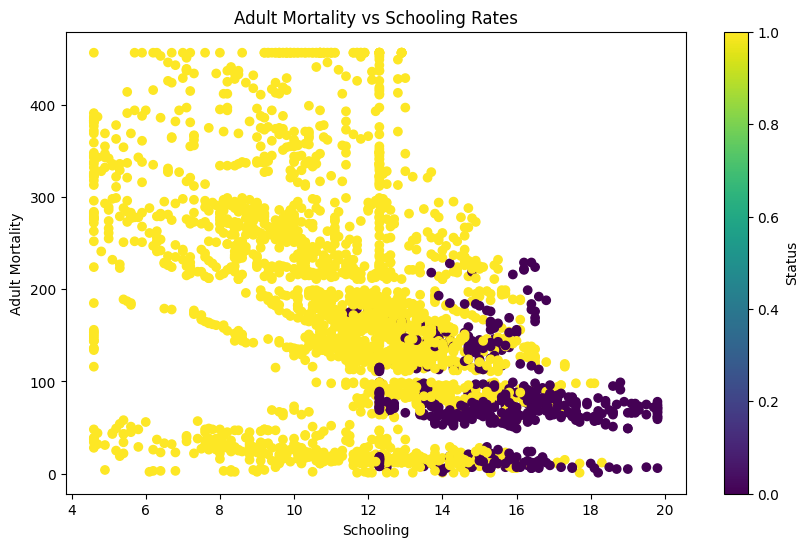

In [ ]:
# @title Adult Mortality vs Schooling Rates with Status

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(df['Schooling'], df['Adult Mortality'], c=df['Status'], cmap='viridis')
plt.xlabel('Schooling')
plt.ylabel('Adult Mortality')
plt.title('Adult Mortality vs Schooling Rates')
_ = plt.colorbar(label='Status')

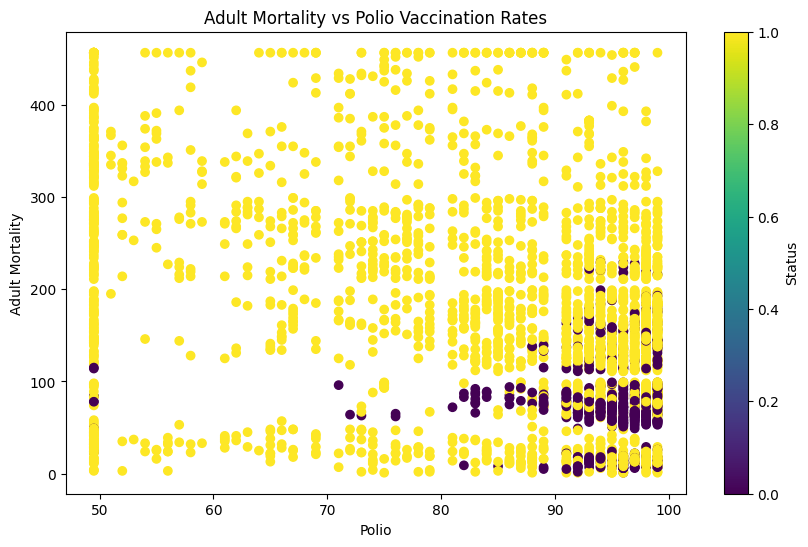

In [ ]:
# @title Adult Mortality vs Polio with Status

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(df['Polio'], df['Adult Mortality'], c=df['Status'], cmap='viridis')
plt.xlabel('Polio')
plt.ylabel('Adult Mortality')
plt.title('Adult Mortality vs Polio Vaccination Rates')
_ = plt.colorbar(label='Status')

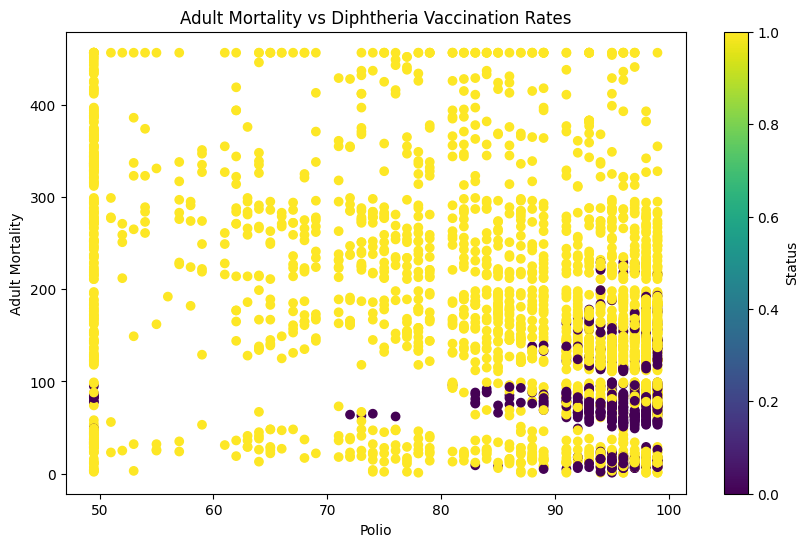

In [ ]:
# @title Adult Mortality vs Diphtheria with Status

import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.scatter(df['Diphtheria'], df['Adult Mortality'], c=df['Status'], cmap='viridis')
plt.xlabel('Polio')
plt.ylabel('Adult Mortality')
plt.title('Adult Mortality vs Diphtheria Vaccination Rates')
_ = plt.colorbar(label='Status')

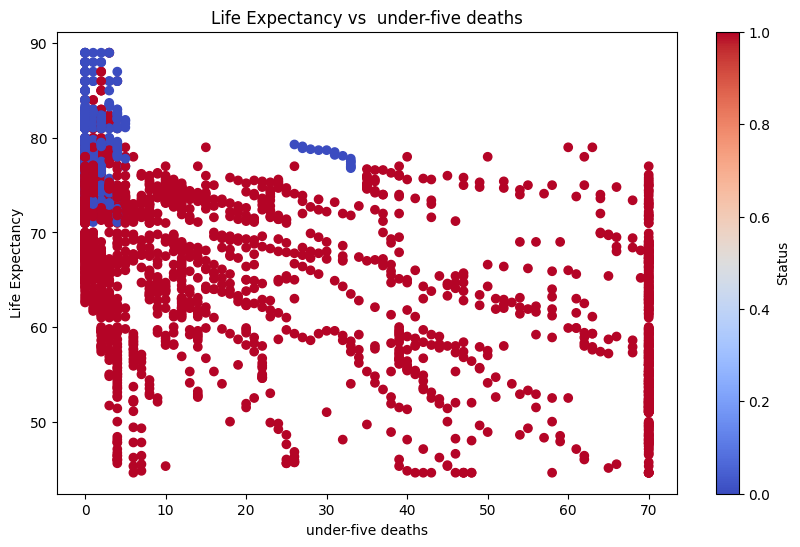

In [ ]:
# @title life expectancy vs under-five deaths with status
plt.figure(figsize=(10, 6))
plt.scatter(df['under-five deaths'], df['Life expectancy'], c=df['Status'], cmap='coolwarm')
plt.xlabel('under-five deaths')
plt.ylabel('Life Expectancy')
plt.title('Life Expectancy vs  under-five deaths')
_ = plt.colorbar(label='Status')

<Axes: >

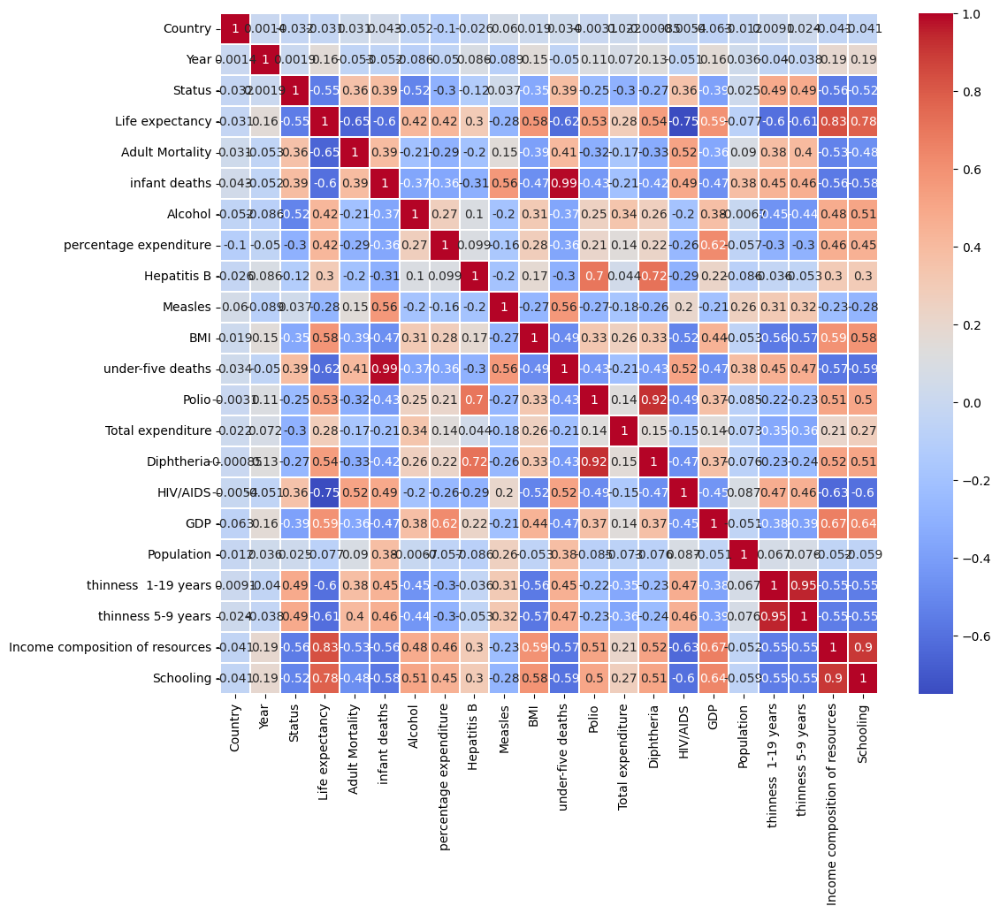

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
corrmat = df.corr(method = "spearman")
f, ax = plt.subplots(figsize=(12, 10))
sns.heatmap(corrmat, ax=ax, cmap = "coolwarm", linewidth = 0.1, annot = True)

**We are going to first build a linear regression model to provide us with a baseline, then also build a random forest regressor.**

In [ ]:
# Drop 'Country' as it may not be meaningful for the prediction model and also due to complex encoding
df = df.drop('Country', axis=1)

In [ ]:
df.columns

Index(['Year', 'Status', 'Life expectancy', 'Adult Mortality', 'infant deaths',
       'Alcohol', 'percentage expenditure', 'Hepatitis B', 'Measles', 'BMI',
       'under-five deaths', 'Polio', 'Total expenditure', 'Diphtheria',
       'HIV/AIDS', 'GDP', 'Population', 'thinness  1-19 years',
       'thinness 5-9 years', 'Income composition of resources', 'Schooling'],
      dtype='object')

In [ ]:
# Split data into features (X) and target variable (y)
X = df.drop('Life expectancy', axis=1)  # Features
y = df['Life expectancy']               # Target

In [ ]:
# Split the data into training and testing sets (80% training, 20% testing)
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
# Check shapes of the datasets
print(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

(2350, 20) (588, 20) (2350,) (588,)


In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score

In [ ]:
# Initialize the Linear Regression model
lr = LinearRegression()

# Train the model
lr.fit(X_train, y_train)

LinearRegression()

In [ ]:
# Make predictions on the test set
y_pred = lr.predict(X_test)

In [ ]:
# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")

Mean Squared Error: 12.151104354895114
R-squared: 0.8595913816959864


In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Calculate VIF for each feature
vif_data = pd.DataFrame()
vif_data['Feature'] = X.columns
vif_data['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print(vif_data)

                            Feature         VIF
0                              Year  146.642986
1                            Status   10.553247
2                   Adult Mortality    5.156659
3                     infant deaths  163.928531
4                           Alcohol    4.373705
5            percentage expenditure    5.885328
6                       Hepatitis B   75.934262
7                           Measles    2.321198
8                               BMI    8.703434
9                 under-five deaths  172.690913
10                            Polio  113.604667
11                Total expenditure    9.271140
12                       Diphtheria  118.578973
13                         HIV/AIDS    3.662546
14                              GDP    7.705376
15                       Population    2.022760
16             thinness  1-19 years   22.345360
17               thinness 5-9 years   22.402425
18  Income composition of resources   41.944905
19                        Schooling   67

In [ ]:
#examining the model coefficients (coefficients tell us how much of the value of the output changes when we change a given input variable)
print("Model coefficients:\n")
for i in range(X.shape[1]):
    print(X.columns[i], "=", lr.coef_[i].round(5))

Model coefficients:

Year = 0.10722
Status = -2.28379
Adult Mortality = -0.0164
infant deaths = 0.30934
Alcohol = 0.0032
percentage expenditure = 0.00186
Hepatitis B = -0.03697
Measles = -0.00013
BMI = -0.00113
under-five deaths = -0.29167
Polio = 0.02084
Total expenditure = 0.02374
Diphtheria = 0.05055
HIV/AIDS = -4.8946
GDP = -3e-05
Population = 0.0
thinness  1-19 years = 0.01037
thinness 5-9 years = -0.13442
Income composition of resources = 8.0177
Schooling = 0.16947


**XAI for Linear Regression**

In [ ]:
import shap

#Create a SHAP explainer for the linear regression model
explainer1 = shap.Explainer(lr, X_train)

In [ ]:
#Calculate SHAP values for the test data
shap_values = explainer1(X_test)

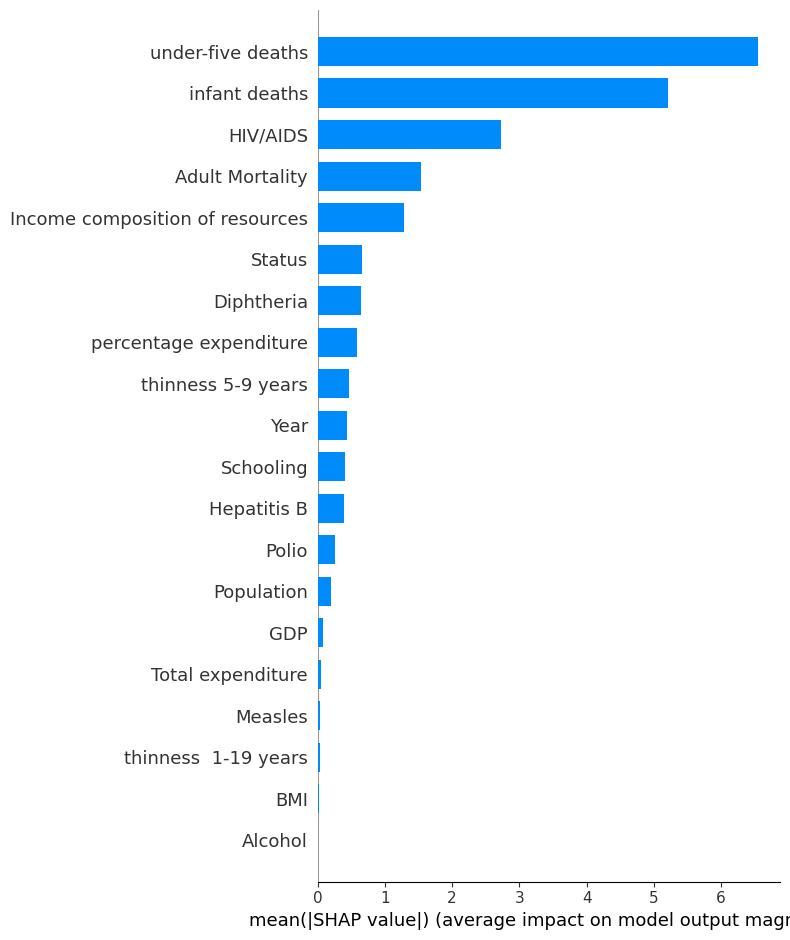

In [ ]:
#Summary plot to show feature importance
shap.summary_plot(shap_values, X_test, plot_type="bar")  # Bar plot for global feature importance

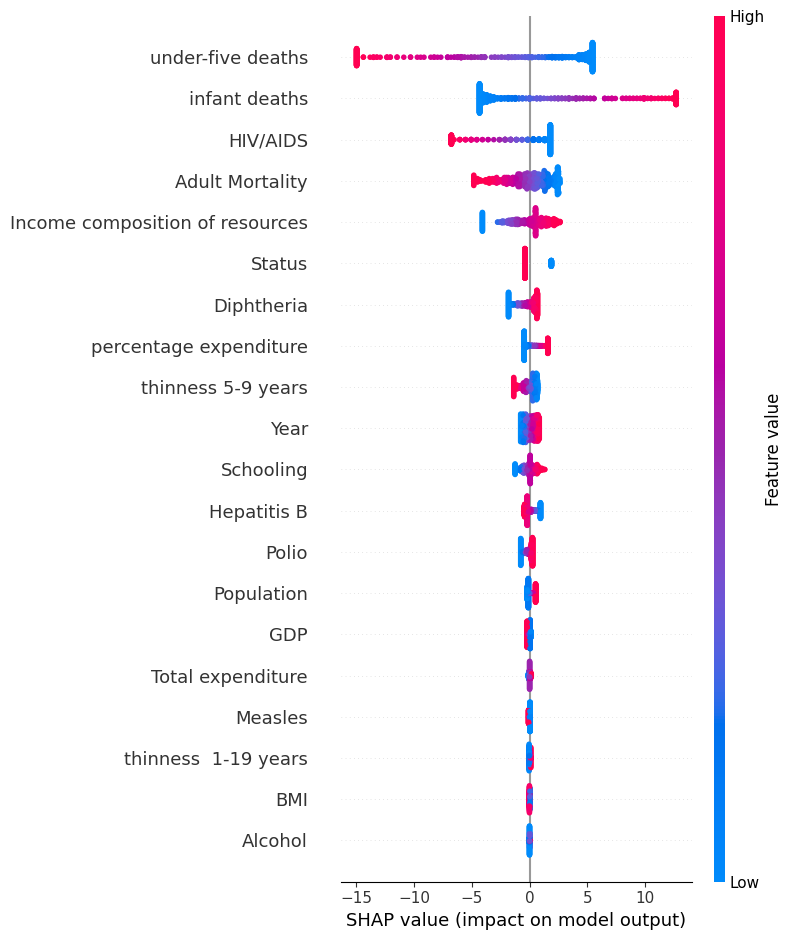

In [ ]:
shap.summary_plot(shap_values, X_test)  # Beeswarm plot for feature impact on prediction

In [ ]:
# SIndividual SHAP force plot (for the first instance in the test set)

#shap.initjs()
#shap.force_plot(explainer.expected_value, shap_values[0], X_test.iloc[0, :], matplotlib=True)

shap.initjs()

# Since X_test has 20 features, use the first 20 feature names from df
feature_names = df.columns[:X_test.shape[1]]

# Now call the force_plot function with the corrected feature_names
shap.force_plot(explainer1.expected_value, shap_values[5].values, X_test.iloc[0, :], feature_names=feature_names)

In [ ]:
pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=6a48e4595a33ec0223ef056c3effc29df6c495eaed4a6cf79e4783319d115be0
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
import lime
import lime.lime_tabular

explainer3 = lime.lime_tabular.LimeTabularExplainer(
    training_data=X_train.values,
    feature_names=X.columns,
    mode='regression'
)

In [ ]:
# Choose an instance to explain
i = 6  # Index of the instance in the test set to explain
instance = X_test.iloc[i].values

# Generate the explanation
explanation = explainer3.explain_instance(
    data_row=instance,
    predict_fn=lr.predict
)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


In [ ]:
# Display the explanation
explanation.show_in_notebook(show_all=False)

**To understand a feature’s importance in a model, it is necessary to understand both how changing that feature impacts the model’s output, and also the distribution of that feature’s values. To visualize this for a linear model we can build a classical partial dependence plot and show the distribution of feature values as a histogram on the x-axis:**

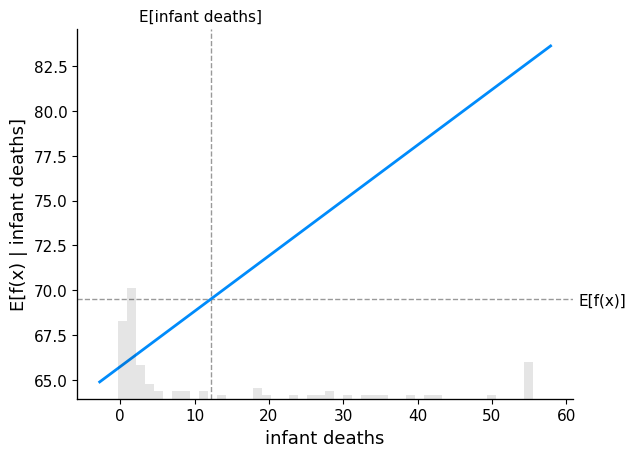

In [ ]:
X100 = shap.utils.sample(X, 100)
shap.partial_dependence_plot(
    "infant deaths",
    lr.predict,
    X100,
    ice=False,
    model_expected_value=True,
    feature_expected_value=True,
)

PermutationExplainer explainer: 2939it [02:53, 16.38it/s]


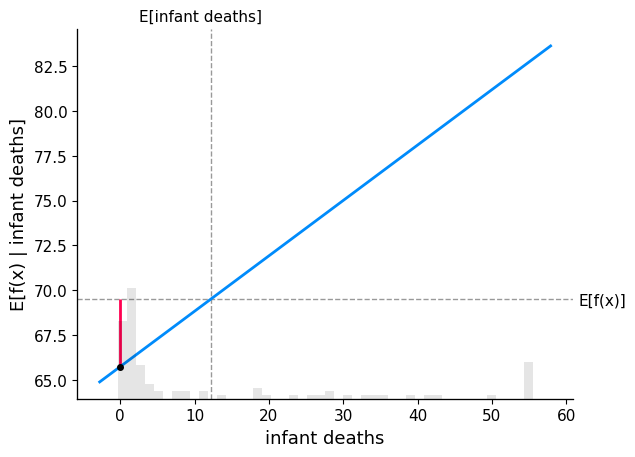

In [ ]:
# compute the SHAP values for the linear model
explainer = shap.Explainer(lr.predict, X100)
shap_values = explainer(X)

# make a standard partial dependence plot
sample_ind = 20
shap.partial_dependence_plot(
    "infant deaths",
    lr.predict,
    X100,
    model_expected_value=True,
    feature_expected_value=True,
    ice=False,
    shap_values=shap_values[sample_ind : sample_ind + 1, :],
)

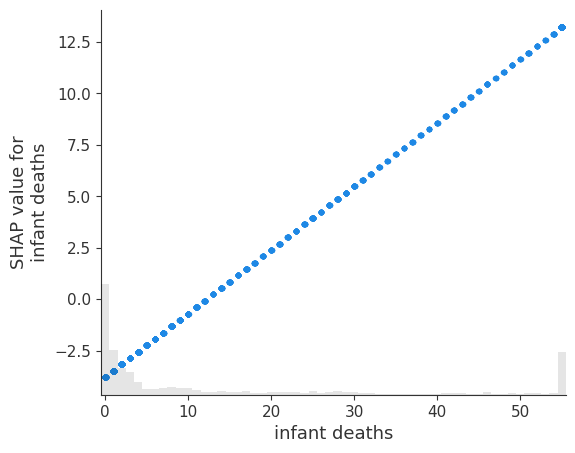

In [ ]:
shap.plots.scatter(shap_values[:, "infant deaths"])

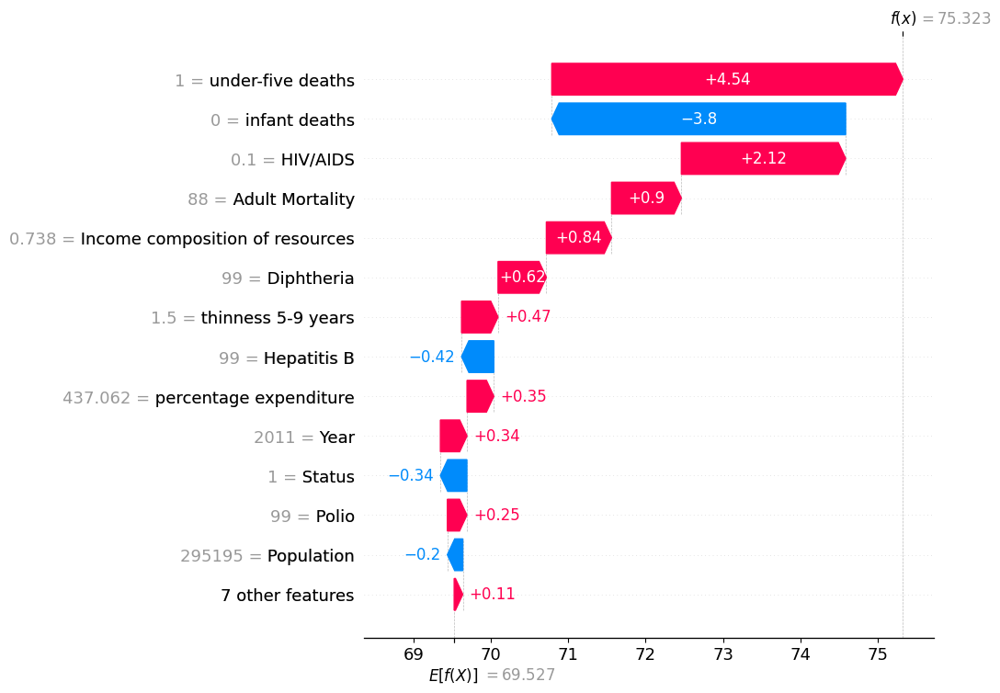

In [ ]:
# the waterfall_plot shows how we get from shap_values.base_values to model.predict(X)[sample_ind]
shap.plots.waterfall(shap_values[sample_ind], max_display=14)

**Explainable LR**

In [ ]:
pip install shap

In [ ]:
import shap
import matplotlib.pyplot as plt

In [ ]:
# load JS visualization code to notebook
shap.initjs()

In [ ]:
# Initialize the SHAP explainer for the linear model
explainer = shap.Explainer(lr, X_train)

In [ ]:
# Compute SHAP values for the test set
shap_values = explainer(X_test)

In [ ]:
shap.initjs()

# Since X_test has 20 features, use the first 20 feature names from df
feature_names = df.columns[:X_test.shape[1]]

# Now call the force_plot function with the corrected feature_names
shap.force_plot(explainer.expected_value, shap_values[0].values, X_test.iloc[0, :], feature_names=feature_names)

Variable Importance Plot - Global Interpretation


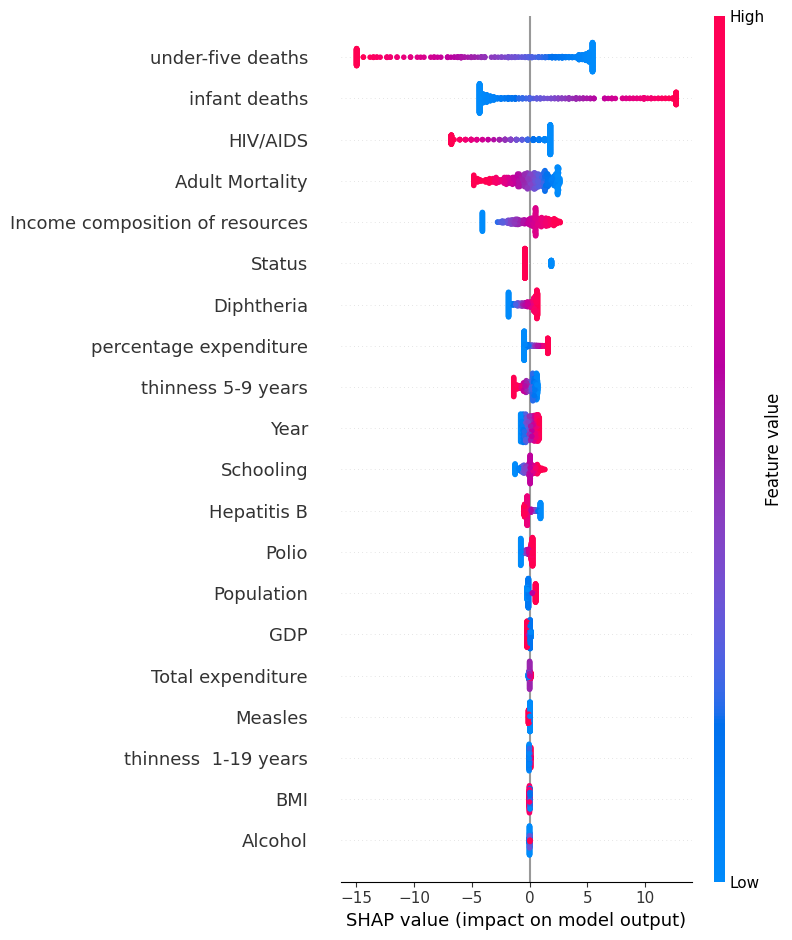

In [ ]:
print("Variable Importance Plot - Global Interpretation")
figure = plt.figure()
shap.summary_plot(shap_values, X_test)

**LR benefits from scaling features especially when they have different units:**

In [ ]:
from sklearn.preprocessing import StandardScaler

# Initialize StandardScaler
scaler = StandardScaler()

# Scale the features
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [ ]:
# Train the model with scaled data
lr.fit(X_train_scaled, y_train)

# Make predictions and evaluate
y_pred_scaled = lr.predict(X_test_scaled)
mse_scaled = mean_squared_error(y_test, y_pred_scaled)
r2_scaled = r2_score(y_test, y_pred_scaled)

print(f"Scaled Mean Squared Error: {mse_scaled}")
print(f"Scaled R-squared: {r2_scaled}")

Scaled Mean Squared Error: 12.151104355007291
Scaled R-squared: 0.8595913816946901


**Check for multicollinearity (using VIF)**

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Calculate VIF for each feature
vif_data = pd.DataFrame()
vif_data['Feature'] = X.columns
vif_data['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

print(vif_data)


                            Feature         VIF
0                              Year  146.642986
1                            Status   10.553247
2                   Adult Mortality    5.156659
3                     infant deaths  163.928531
4                           Alcohol    4.373705
5            percentage expenditure    5.885328
6                       Hepatitis B   75.934262
7                           Measles    2.321198
8                               BMI    8.703434
9                 under-five deaths  172.690913
10                            Polio  113.604667
11                Total expenditure    9.271140
12                       Diphtheria  118.578973
13                         HIV/AIDS    3.662546
14                              GDP    7.705376
15                       Population    2.022760
16             thinness  1-19 years   22.345360
17               thinness 5-9 years   22.402425
18  Income composition of resources   41.944905
19                        Schooling   67

**We plotted the residuals to check if they are normally distributed and have constant variance**

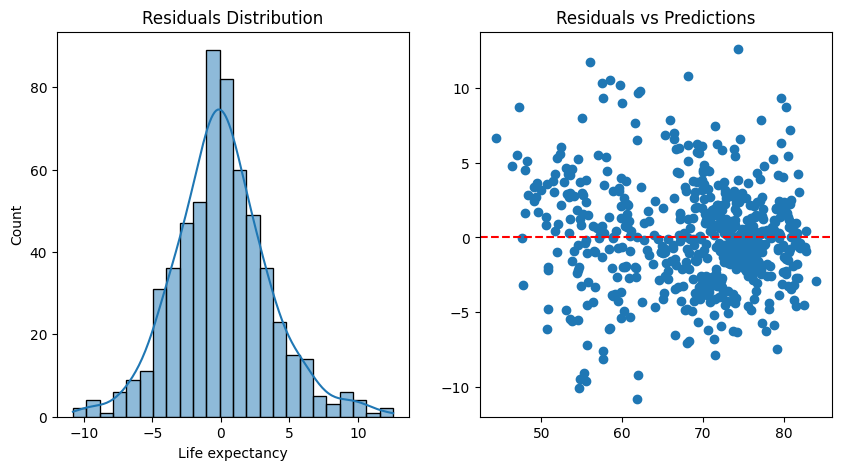

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate residuals
residuals = y_test - y_pred

# Plot residuals
plt.figure(figsize=(10, 5))

# Residuals distribution (should look normally distributed)
plt.subplot(1, 2, 1)
sns.histplot(residuals, kde=True)
plt.title('Residuals Distribution')

# Residuals vs Predictions (should show no clear pattern)
plt.subplot(1, 2, 2)
plt.scatter(y_pred, residuals)
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Residuals vs Predictions')

plt.show()


**We're going to do some feature selection to improve the performance of our model. We're to use a heatmap**

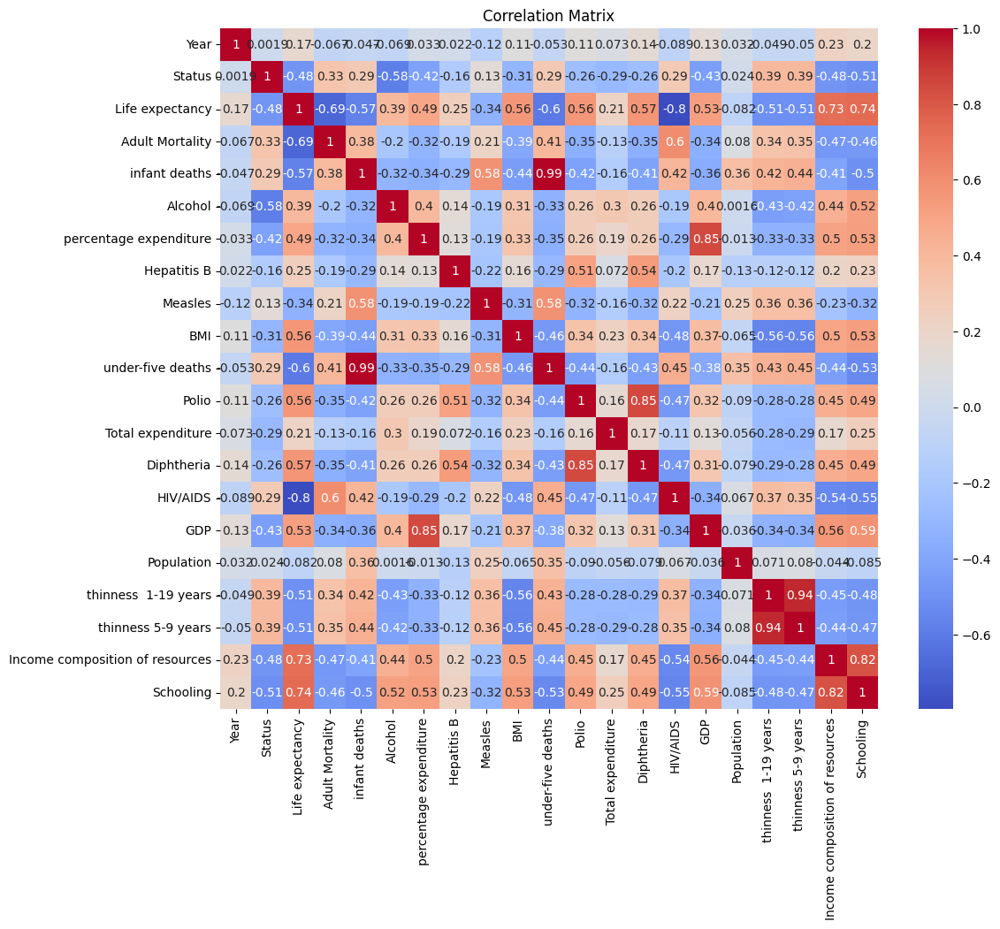

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Compute the correlation matrix
corr_matrix = df.corr()

# Plot the correlation heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix')
plt.show()

In [ ]:
#drop features with a correlation less than 0.5
X = df.drop(columns = ['Year', 'Status', 'Hepatitis B', 'Alcohol', 'Measles'], axis=1)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
lr1 = LinearRegression()
lr1.fit(X_train, y_train)

LinearRegression()

In [ ]:
# Make predictions on the test set
y_pred_1 = lr1.predict(X_test)

In [ ]:
mse = mean_squared_error(y_test, y_pred_1)
r2 = r2_score(y_test, y_pred_1)

print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")

Mean Squared Error: 9.749450068979278e-22
R-squared: 1.0


In [ ]:
df.columns

Index(['Year', 'Status', 'Life expectancy', 'Adult Mortality', 'infant deaths',
       'Alcohol', 'percentage expenditure', 'Hepatitis B', 'Measles', 'BMI',
       'under-five deaths', 'Polio', 'Total expenditure', 'Diphtheria',
       'HIV/AIDS', 'GDP', 'Population', 'thinness  1-19 years',
       'thinness 5-9 years', 'Income composition of resources', 'Schooling'],
      dtype='object')

**LR after dealing with multicollinearity (infant deaths and under-five deaths**

In [ ]:
x1 = df.drop(columns = ['under-five deaths', 'Life expectancy'], axis=1)
y1 = df['Life expectancy']

In [ ]:
x1_train, x1_test, y1_train, y1_test = train_test_split(x1, y1, test_size=0.2, random_state=42)

In [ ]:
lr2 = LinearRegression()
lr2.fit(x1_train, y1_train)

LinearRegression()

In [ ]:
# Make predictions on the test set
y_pred_2 = lr2.predict(x1_test)

In [ ]:
mse = mean_squared_error(y1_test, y_pred_2)
r2 = r2_score(y1_test, y_pred_2)

print(f"Mean Squared Error: {mse}")
print(f"R-squared: {r2}")

Mean Squared Error: 12.54316484172744
R-squared: 0.855061038639098


In [ ]:
x1.columns

Index(['Year', 'Status', 'Adult Mortality', 'infant deaths', 'Alcohol',
       'percentage expenditure', 'Hepatitis B', 'Measles', 'BMI',
       'under-five deaths', 'Polio', 'Total expenditure', 'Diphtheria',
       'HIV/AIDS', 'GDP', 'Population', 'thinness  1-19 years',
       'thinness 5-9 years', 'Income composition of resources', 'Schooling'],
      dtype='object')

In [ ]:
import pandas as pd
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Assuming `df` is your DataFrame and it contains all your features (no target variable)

# Add a constant (intercept) to the model
X = sm.add_constant(df)

# Calculate VIF for each feature
vif_data = pd.DataFrame()
vif_data["Feature"] = x1.columns
vif_data["VIF"] = [variance_inflation_factor(x1.values, i) for i in range(x1.shape[1])]

print(vif_data)

                            Feature         VIF
0                              Year  144.004329
1                            Status   10.367455
2                   Adult Mortality    5.148154
3                     infant deaths    3.419726
4                           Alcohol    4.363779
5            percentage expenditure    5.880875
6                       Hepatitis B   75.783131
7                           Measles    2.321061
8                               BMI    8.673636
9                             Polio  113.426334
10                Total expenditure    9.268940
11                       Diphtheria  118.570451
12                         HIV/AIDS    3.436039
13                              GDP    7.704959
14                       Population    2.021732
15             thinness  1-19 years   22.342602
16               thinness 5-9 years   22.395000
17  Income composition of resources   41.638006
18                        Schooling   67.226677


In [ ]:
# 2. Ridge Regression (L2 regularization)
from sklearn.linear_model import LinearRegression, Ridge, Lasso

ridge_model = Ridge(alpha=1.0)
ridge_model.fit(x1_train, y1_train)
y_pred_ridge = ridge_model.predict(x1_test)
mse_ridge = mean_squared_error(y1_test, y_pred_ridge)
r2_ridge = r2_score(y_test, y_pred_ridge)
print("Ridge Regression - MSE:", mse_ridge)
print("Ridge Regression - R^2:", r2_ridge)

Ridge Regression - MSE: 12.497943321072157
Ridge Regression - R^2: 0.855583583014273


In [ ]:
from sklearn.feature_selection import RFE
import pandas as pd
# Performing RFE
selector = RFE(lr2, n_features_to_select=8)  # Selecting 8 features
selector = selector.fit(x1, y1)

# Get the features ranking
ranking_df = pd.DataFrame({
    'Feature': x1.columns,
    'Ranking': selector.ranking_
})

# Sort by ranking (1 is the most important feature)
ranking_df = ranking_df.sort_values(by='Ranking')

# Display the sorted feature rankings
print(ranking_df)

# Alternatively, display only the selected features
selected_features = x1.columns[selector.support_]
print(f"Selected features: {selected_features}")


                            Feature  Ranking
0                              Year        1
16               thinness 5-9 years        1
12                         HIV/AIDS        1
10                Total expenditure        1
17  Income composition of resources        1
18                        Schooling        1
3                     infant deaths        1
1                            Status        1
15             thinness  1-19 years        2
11                       Diphtheria        3
6                       Hepatitis B        4
9                             Polio        5
4                           Alcohol        6
2                   Adult Mortality        7
8                               BMI        8
5            percentage expenditure        9
7                           Measles       10
13                              GDP       11
14                       Population       12
Selected features: Index(['Year', 'Status', 'infant deaths', 'Total expenditure', 'HIV/AIDS',
      

In [ ]:
x1 = df.drop(columns = ['GDP', 'Population', 'Measles', 'percentage expenditure', 'BMI'])

In [ ]:
x1.columns

Index(['Year', 'Status', 'Adult Mortality', 'infant deaths', 'Alcohol',
       'percentage expenditure', 'Hepatitis B', 'Measles', 'BMI',
       'under-five deaths', 'Polio', 'Total expenditure', 'Diphtheria',
       'HIV/AIDS', 'GDP', 'Population', 'thinness  1-19 years',
       'thinness 5-9 years', 'Income composition of resources', 'Schooling'],
      dtype='object')

AttributeError: 'Series' object has no attribute 'columns'

**Now, let's build a random forest regressor.**

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import LabelEncoder

In [ ]:
# Dropping rows with any remaining missing values (to avoid issues)
df = df.dropna()

In [ ]:
df.shape

(2938, 21)

In [ ]:
# Define features (X) and target (y)
#X = df.drop(columns=['Life expectancy', 'Country'])  # Drop 'Country' due to complexity in encoding
#y = df['Life expectancy']

In [ ]:
# Split the dataset into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
# Initialize Random Forest Regressor
rf = RandomForestRegressor(n_estimators=100, random_state=42)

In [ ]:
#Train the model
rf.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

In [ ]:
# Make predictions
y_pred_test = rf.predict(X_test)

In [ ]:
# Evaluatng the model performance
mse = mean_squared_error(y_test, y_pred_test)
rmse = mse ** 0.5
r2 = r2_score(y_test, y_pred_test)

In [ ]:
print(f'MSE: {mse}, RMSE: {rmse}, R^2: {r2}')

MSE: 2.7988371768707463, RMSE: 1.672972557118241, R^2: 0.9677059852111324


**XAI for Random Forests**

In [ ]:
rf_explainer = shap.TreeExplainer(rf)

In [ ]:
# Calculate SHAP values for the test set
shap_values = rf_explainer.shap_values(X_test)

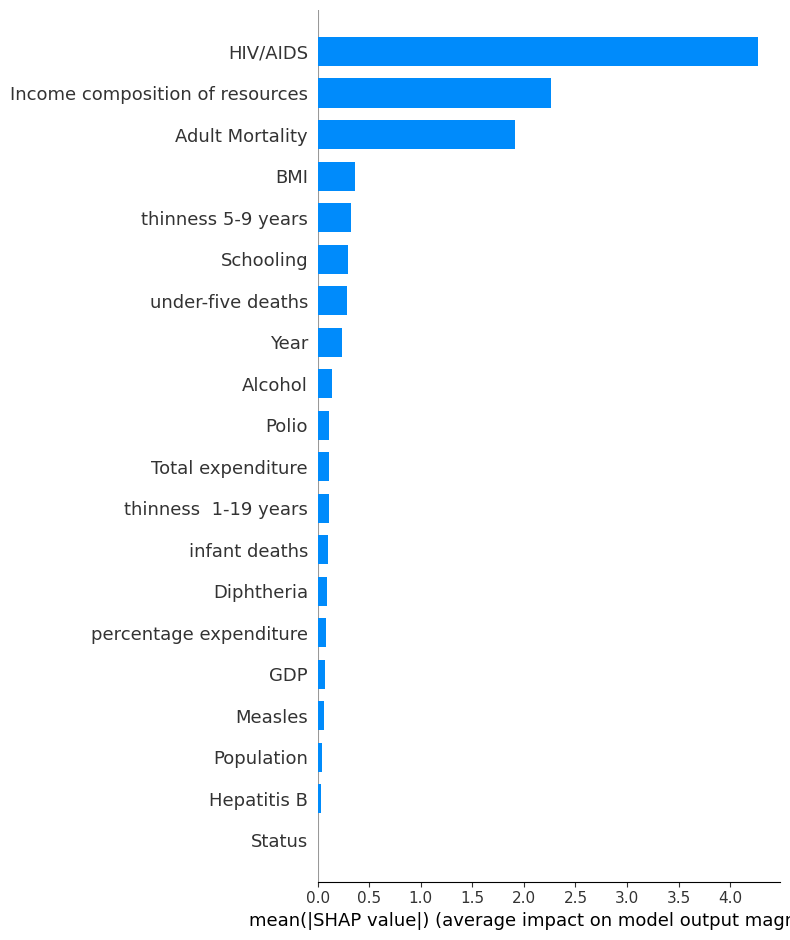

In [ ]:
shap.summary_plot(shap_values, X_test, plot_type="bar")  # Feature importance

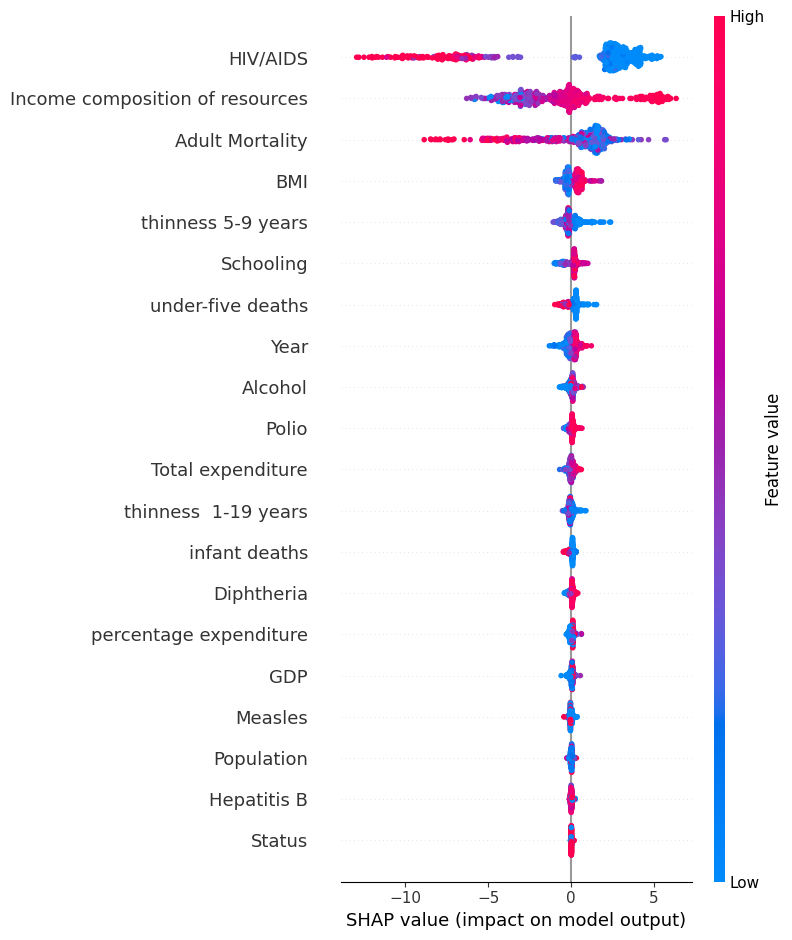

In [ ]:
shap.summary_plot(shap_values, X_test)                   # Detailed scatter plot

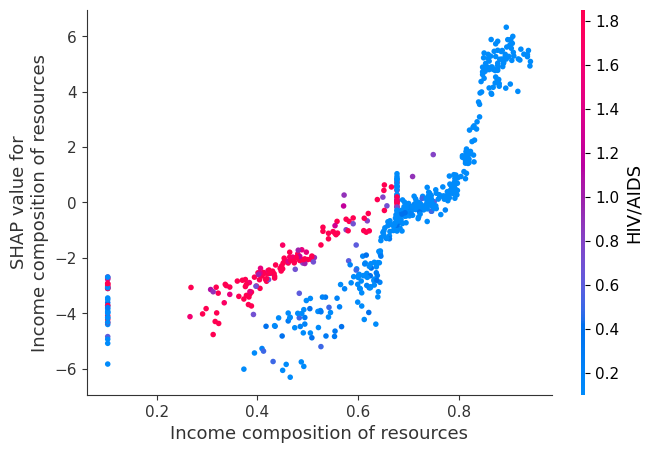

In [ ]:
#Dependence Plot: Shows the impact of a single feature across its range, interacting with another feature.
shap.dependence_plot("Income composition of resources", shap_values, X_test)

In [ ]:
#Force Plot: Visualizes SHAP values for individual predictions, showing how each feature contributed to the prediction.

# load JS visualization code to notebook
shap.initjs()


shap.force_plot(explainer.expected_value, shap_values[0], X_test.iloc[0])

In [ ]:
y_pred_train = rf.predict(X_train)
mse = mean_squared_error(y_train, y_pred_train)
rmse = mse ** 0.5
r2 = r2_score(y_train, y_pred_train)
print(f'MSE: {mse}, RMSE: {rmse}, R^2: {r2}')

MSE: 0.5276490285106383, RMSE: 0.7263945405292074, R^2: 0.9941809617678208


**Hyperparameter tuning using grid search**

In [ ]:
from sklearn.model_selection import GridSearchCV

# Define the parameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, 30, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

In [ ]:
# Initialize GridSearchCV with Random Forest
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=3, n_jobs=-1, verbose=2)


In [ ]:
# Fit the model to the training data
grid_search.fit(X_train, y_train)

Fitting 3 folds for each of 108 candidates, totalling 324 fits


GridSearchCV(cv=3, estimator=RandomForestRegressor(random_state=42), n_jobs=-1,
             param_grid={'max_depth': [10, 20, 30, None],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [100, 200, 300]},
             verbose=2)

In [ ]:
# Best parameters
print(f"Best parameters: {grid_search.best_params_}")

Best parameters: {'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 300}


In [ ]:
# Make predictions with the best estimator
best_rf = grid_search.best_estimator_
y_pred_best = best_rf.predict(X_test)

In [ ]:
# Evaluate the tuned model
mse_best = mean_squared_error(y_test, y_pred_best)
r2_best = r2_score(y_test, y_pred_best)

In [ ]:
print(f"Tuned Mean Squared Error: {mse_best}")
print(f"Tuned R-squared: {r2_best}")

Tuned Mean Squared Error: 2.753029402599778
Tuned R-squared: 0.9682345321919917


***XAI for GridSearch CV***

In [ ]:
### SHAP Explanation
# Initiazing SHAP explainer for the best model and calculate SHAP values
import shap

explainer_shap = shap.TreeExplainer(best_rf)
shap_values = explainer_shap.shap_values(X_test)

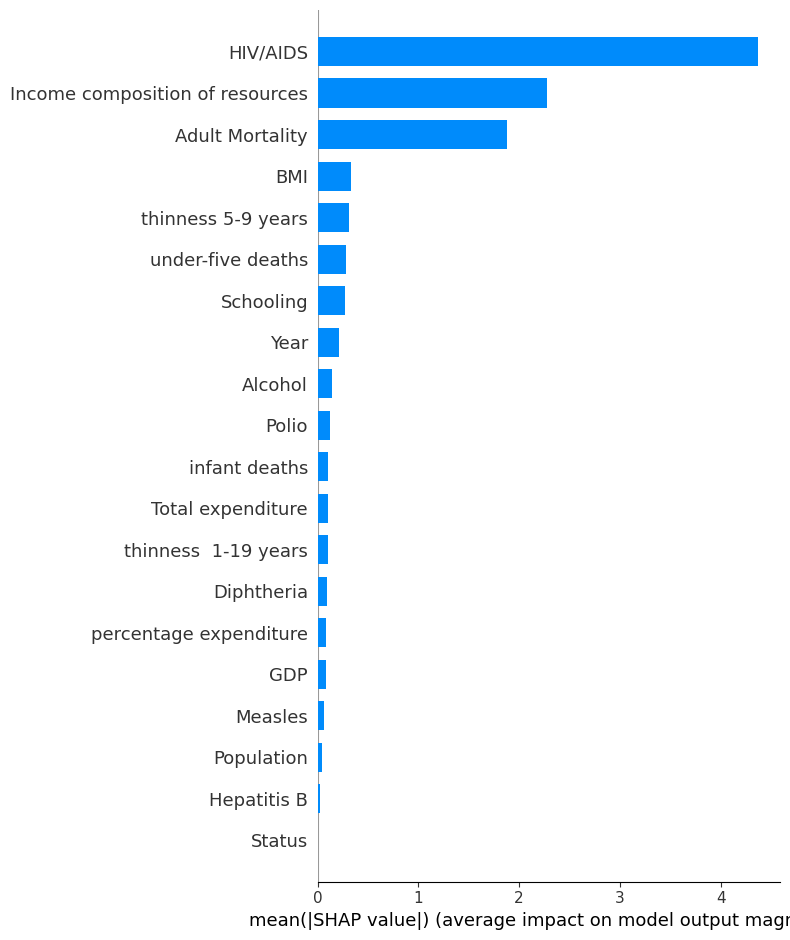

In [ ]:
shap.summary_plot(shap_values, X_test, plot_type="bar")

In [ ]:
pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 7.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=50b63e8aaa1f7a7d79c0111310db20ca34b08f4a4c9229051590ef59aaea1d46
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
# Initialize LIME explainer
import lime
from lime.lime_tabular import LimeTabularExplainer

explainer_lime = LimeTabularExplainer(X_train.values, feature_names=X_train.columns, mode='regression')

In [ ]:
# Choose an instance to explain
i = 5  # Example index of the test sample
exp = explainer_lime.explain_instance(X_test.values[i], best_rf.predict, num_features=4)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


In [ ]:
# Display LIME explanation
exp.show_in_notebook()  # Shows in Jupyter Notebook

**We inspected which features have the most impact on life expectancy predictions:**

In [ ]:
# Get feature importances from the Random Forest model
importances = rf.feature_importances_

In [ ]:
# Create a DataFrame to display feature importances
feature_importances = pd.DataFrame({'Feature': X.columns, 'Importance': importances})

In [ ]:
# Sort the DataFrame by importance
feature_importances = feature_importances.sort_values(by='Importance', ascending=False)

In [ ]:
# Display feature importances
print(feature_importances)

                            Feature  Importance
13                         HIV/AIDS    0.586554
18  Income composition of resources    0.164818
2                   Adult Mortality    0.141458
8                               BMI    0.018952
9                 under-five deaths    0.012974
19                        Schooling    0.012031
17               thinness 5-9 years    0.009557
0                              Year    0.007778
4                           Alcohol    0.007177
16             thinness  1-19 years    0.005830
11                Total expenditure    0.005206
14                              GDP    0.004442
3                     infant deaths    0.004122
7                           Measles    0.003669
5            percentage expenditure    0.003609
10                            Polio    0.003557
12                       Diphtheria    0.003140
15                       Population    0.002922
6                       Hepatitis B    0.002045
1                            Status    0

**XGBoost Model** XGBoost is well-suited for regression because it can handle complex relationships between features without assuming linearity. It’s particularly useful if your data has non-linear relationships or if you want to automatically handle interactions between features. Additionally, XGBoost includes options for regularization (via alpha and lambda parameters), which can help in cases of multicollinearity by controlling feature contributions.

In [ ]:
from xgboost import XGBRegressor
model = XGBRegressor()

In [ ]:
model.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [ ]:
model.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=None, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=None, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=None, n_jobs=None,
             num_parallel_tree=None, random_state=None, ...)

In [ ]:
y_test_xgb = model.predict(X_test)

In [ ]:
mse_best = mean_squared_error(y_test, y_test_xgb)
r2_best = r2_score(y_test, y_test_xgb)

In [ ]:
print(f"XGBoost Mean Squared Error: {mse_best}")
print(f"XGBoost R-squared: {r2_best}")

XGBoost Mean Squared Error: 2.8434075032331627
XGBoost R-squared: 0.967143816138539


In [ ]:
# compute the SHAP values for the linear model
background_adult = shap.maskers.Independent(X_train, max_samples=100)

In [ ]:
# compute SHAP values
explainer = shap.Explainer(model, background_adult)
shap_values = explainer(X_train)

 97%|=================== | 2283/2350 [00:17<00:00]       

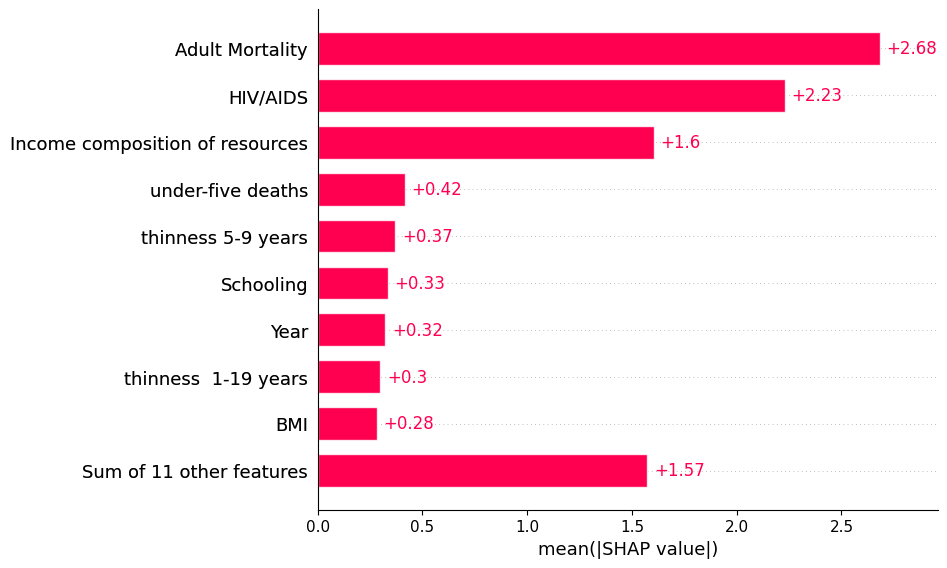

In [ ]:
shap.plots.bar(shap_values)

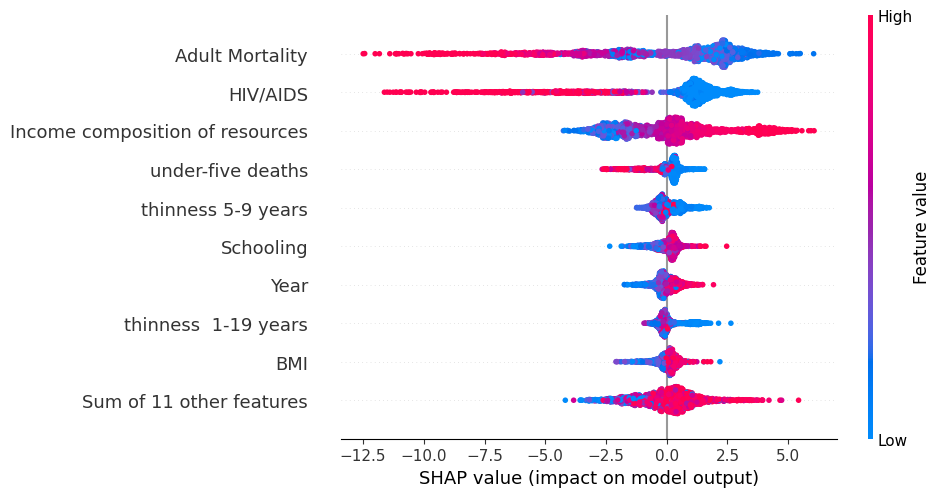

In [ ]:
"""If we are willing to deal with a bit more complexity, we can use a beeswarm plot
to summarize the entire distribution of SHAP values for each feature."""
shap.plots.beeswarm(shap_values)